In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns 
import sklearn
import warnings
import lasio

from sklearn import preprocessing

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### Log Data

In [2]:
Well1_path = '/Users/rishabhpandey/Desktop/Spring 2021/Data Analytics/Python/MIP3H_Log Data.las'
Well1 = lasio.read(Well1_path)

In [3]:
Well1.keys()

['DEPT',
 'CDF',
 'CFTC',
 'CNTC',
 'CTEM',
 'DCAL',
 'DI_HRLT',
 'DNPH',
 'DPHZ',
 'DPH8',
 'DSOZ',
 'ECGR',
 'ED',
 'GDEV',
 'GR',
 'GR_EDTC',
 'GTEM',
 'HCAL',
 'HCGR',
 'HDRA',
 'HDRB',
 'HFK',
 'HGR',
 'HMIN',
 'HMNO',
 'HNPO',
 'HPRA',
 'HSGR',
 'HTHO',
 'HTNP',
 'HURA',
 'ND',
 'NPHI',
 'NPOR',
 'PEF8',
 'PEFZ',
 'PXND_HILT',
 'RHO8',
 'RHOZ',
 'RLA0',
 'RLA1',
 'RLA2',
 'RLA3',
 'RLA4',
 'RLA5',
 'RM_HRLT',
 'RSOZ',
 'RT_HRLT',
 'RWA_HILT',
 'RXO8',
 'RXO',
 'RXO_HRLT',
 'RXOZ',
 'STIT',
 'TENS',
 'TNPH',
 'HTNP_SAN',
 'HDPH_SAN']

In [4]:
print(Well1.curves)

Mnemonic   Unit  Value  Description                                                                                                        
--------   ----  -----  -----------                                                                                                        
DEPT       F            DEPTH (BOREHOLE) {F12.4}                                                                                           
CDF        LBF          Calibrated Downhole Force {F11.4}                                                                                  
CFTC       HZ           Corrected Far Thermal Count Rate {F11.4}                                                                           
CNTC       HZ           Corrected Near Thermal Count Rate {F11.4}                                                                          
CTEM       DEGF         Cartridge Temperature {F11.4}                                                                                      
DCAL       IN       

### Reading in to a Pandas Dataframe Directly from a .LAS file

In [5]:
Well_Log = lasio.read(Well1_path)
Well_Log.data.shape

(12115, 58)

### Converting the Lasio object to a Pandas Dataframe

In [6]:
logdataframe = Well_Log.df()
logdataframe.head()

,CDF,CFTC,CNTC,CTEM,DCAL,DI_HRLT,DNPH,DPHZ,DPH8,DSOZ,...,RWA_HILT,RXO8,RXO,RXO_HRLT,RXOZ,STIT,TENS,TNPH,HTNP_SAN,HDPH_SAN
DEPT,,,,,,,,,,,,,,,,,,,,,
1780.5,1095.6510,1027.0125,1607.9729,107.0000,-3.3509,8.8991,-0.0216,-0.9217,-0.9068,0.3719,...,0.0,0.03,0.0000,0.0000,0.03,0.0,1487.7500,0.0783,0.1201,-0.9806
1781.0,1099.3838,933.9886,1564.1593,107.2470,-3.3509,8.8991,-0.0226,-0.9061,-0.8977,0.3663,...,0.0,0.03,0.0012,0.0012,0.03,0.0,1498.7501,0.0926,0.1360,-0.9712
1781.5,1099.3838,795.1089,1456.9730,106.5059,-3.3509,8.8991,-0.0240,-0.8979,-0.8974,0.3652,...,0.0,0.03,0.0010,0.0010,0.03,0.0,1495.6250,0.1145,0.1593,-0.9709
1782.0,1096.8953,644.2500,1362.6663,107.2470,-3.3509,8.8991,-0.0263,-0.8935,-0.9048,0.3718,...,10.0,0.03,99999.9999,99999.9999,0.03,0.0,1485.2858,0.1554,0.2035,-0.9785
1782.5,1098.1395,515.8818,1266.2758,107.2470,-3.3292,8.9208,-0.0287,-0.8872,-0.8778,0.3779,...,10.0,0.03,99999.9999,99999.9999,0.03,0.0,1500.3750,0.2084,0.2588,-0.9504


In [7]:
Well_Log = logdataframe.rename_axis('DEPTH').reset_index()
Well_Log.head()

,DEPTH,CDF,CFTC,CNTC,CTEM,DCAL,DI_HRLT,DNPH,DPHZ,DPH8,...,RWA_HILT,RXO8,RXO,RXO_HRLT,RXOZ,STIT,TENS,TNPH,HTNP_SAN,HDPH_SAN
0,1780.5,1095.6510,1027.0125,1607.9729,107.0000,-3.3509,8.8991,-0.0216,-0.9217,-0.9068,...,0.0,0.03,0.0000,0.0000,0.03,0.0,1487.7500,0.0783,0.1201,-0.9806
1,1781.0,1099.3838,933.9886,1564.1593,107.2470,-3.3509,8.8991,-0.0226,-0.9061,-0.8977,...,0.0,0.03,0.0012,0.0012,0.03,0.0,1498.7501,0.0926,0.1360,-0.9712
2,1781.5,1099.3838,795.1089,1456.9730,106.5059,-3.3509,8.8991,-0.0240,-0.8979,-0.8974,...,0.0,0.03,0.0010,0.0010,0.03,0.0,1495.6250,0.1145,0.1593,-0.9709
3,1782.0,1096.8953,644.2500,1362.6663,107.2470,-3.3509,8.8991,-0.0263,-0.8935,-0.9048,...,10.0,0.03,99999.9999,99999.9999,0.03,0.0,1485.2858,0.1554,0.2035,-0.9785
4,1782.5,1098.1395,515.8818,1266.2758,107.2470,-3.3292,8.9208,-0.0287,-0.8872,-0.8778,...,10.0,0.03,99999.9999,99999.9999,0.03,0.0,1500.3750,0.2084,0.2588,-0.9504


### Selecting Depth and NPHI


In [8]:
Well_Log_1 = Well_Log[['DEPTH', 'NPHI']]

### Matrix Scatter Plot

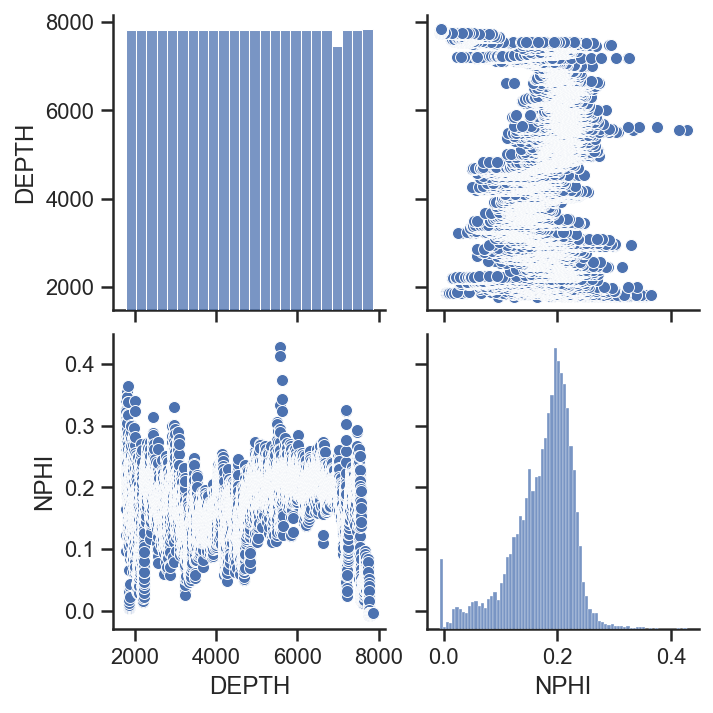

In [9]:
sns.set(style = 'ticks')
sns.pairplot(Well_Log_1)

<AxesSubplot:ylabel='NPHI'>

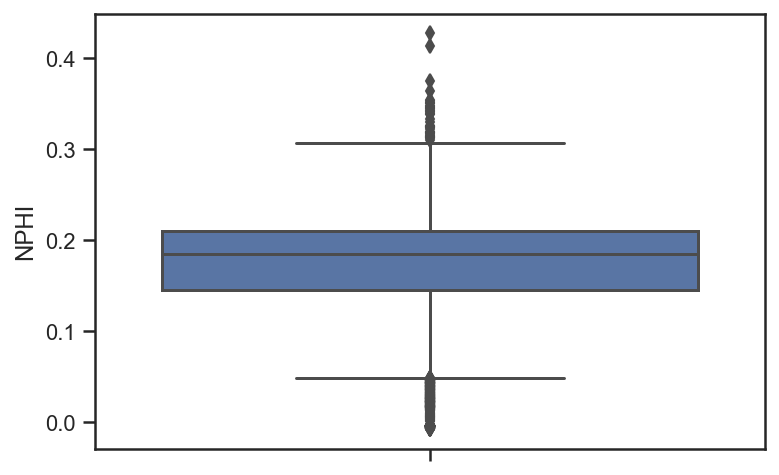

In [10]:
sns.boxplot(y = Well_Log_1['NPHI'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'NPHI'}>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

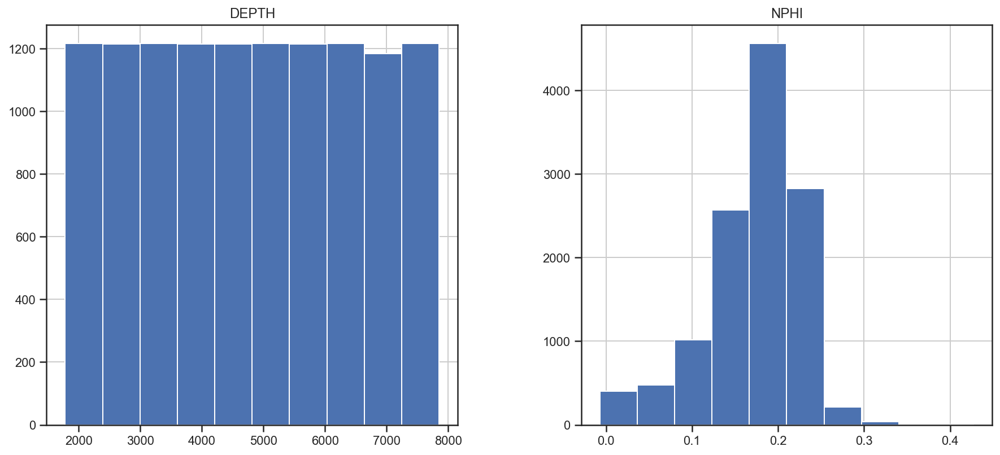

In [11]:
Well_Log_1.hist(figsize = (15, 15), layout = (2,2))

In [12]:
depth = Well_Log_1['DEPTH']
nphi = Well_Log_1['NPHI']

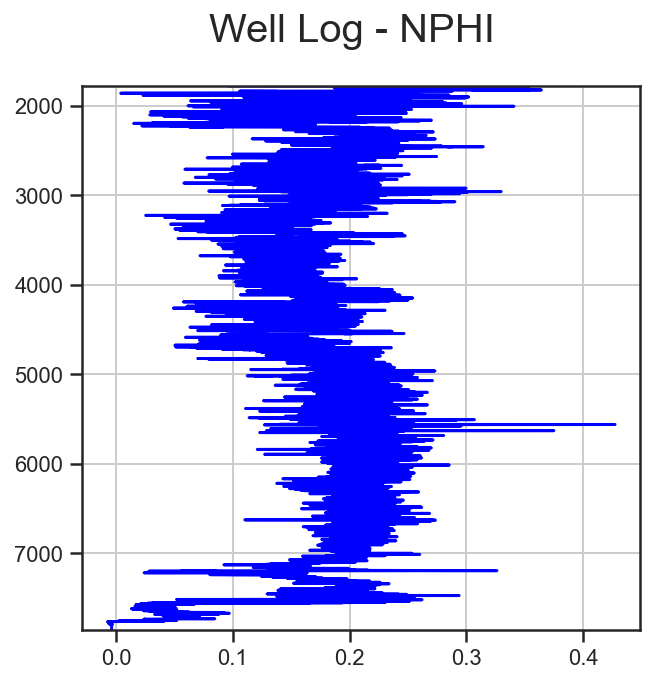

In [13]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - NPHI', size=20)

plt.subplot(1,1,1)
plt.plot(nphi, depth, color='blue')
plt.ylim(max(depth), min(depth))
plt.grid()

plt.show()

### Missing Values

In [14]:
Well_Log_1.isna().sum()

DEPTH    0
NPHI     0
dtype: int64

In [15]:
Well_Log_1.describe()

,DEPTH,NPHI
count,12115.000000,12115.000000
mean,4811.427363,0.173019
std,1752.251022,0.055489
min,1780.500000,-0.007200
25%,3294.750000,0.145800
50%,4809.000000,0.185400
75%,6323.250000,0.210500
max,7852.500000,0.427400


### Removing Negative NPHI Values

In [16]:
NPHI_Data = Well_Log_1[(Well_Log_1['NPHI'] > 0)]
NPHI_Data.head()

,DEPTH,NPHI
0,1780.5,0.0962
1,1781.0,0.1234
2,1781.5,0.1650
3,1782.0,0.2207
4,1782.5,0.2515


In [17]:
NPHI_Data.describe()

,DEPTH,NPHI
count,11934.000000,11934.000000
mean,4765.986677,0.175711
std,1725.898288,0.051388
min,1780.500000,0.001800
25%,3272.125000,0.148100
50%,4763.750000,0.186300
75%,6255.375000,0.210900
max,7762.000000,0.427400


### Removing Outliers

In [18]:
from scipy import stats

NPHI_Data_MIP = NPHI_Data[['DEPTH','NPHI']]

NPHI_Data_MIP = NPHI_Data_MIP[(np.abs(stats.zscore(NPHI_Data_MIP)) < 3).all(axis=1)]

NPHI_Data = NPHI_Data.merge(NPHI_Data_MIP,on=['DEPTH','NPHI'])

In [19]:
NPHI_Data_MIP.describe()

,DEPTH,NPHI
count,11823.000000,11823.000000
mean,4754.990315,0.176703
std,1712.415303,0.049087
min,1780.500000,0.021700
25%,3273.750000,0.149000
50%,4751.500000,0.186600
75%,6231.750000,0.210950
max,7761.000000,0.329800


### Matrix Scatter Plots, Box Plots and Histogram after removing Outliers and negative values

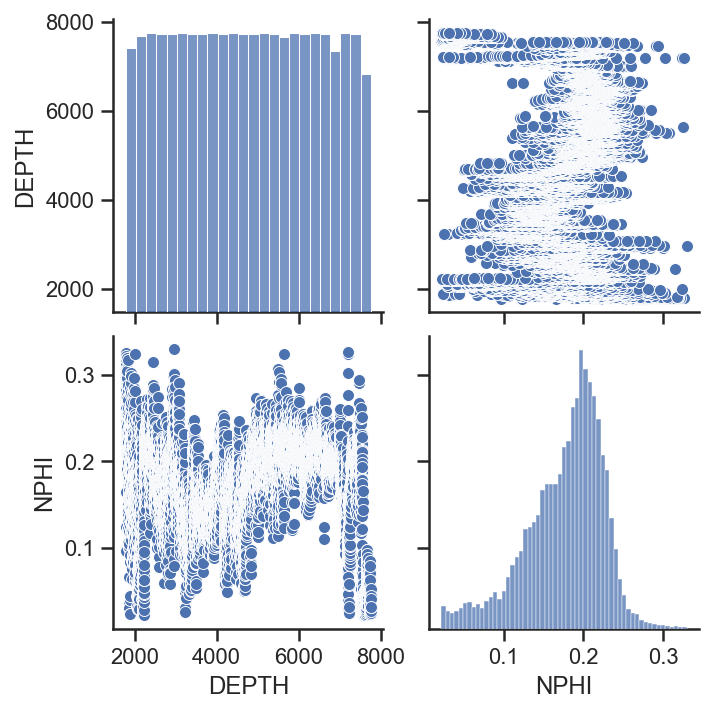

In [20]:
sns.set(style = 'ticks')
sns.pairplot(NPHI_Data_MIP)

<AxesSubplot:ylabel='NPHI'>

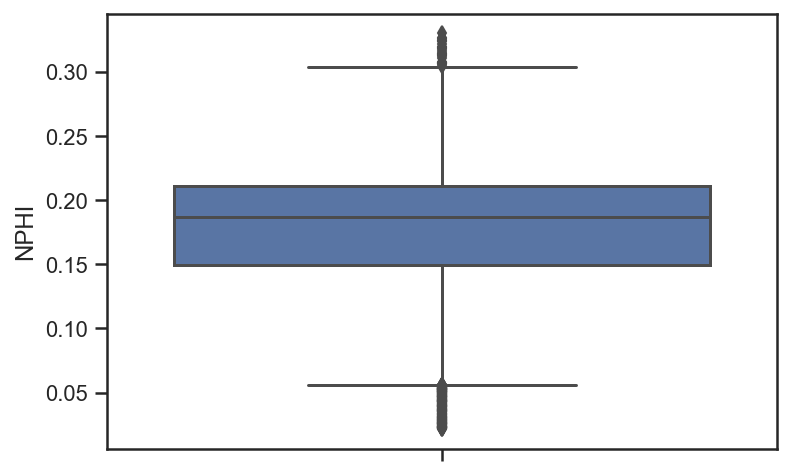

In [21]:
sns.boxplot(y = NPHI_Data_MIP['NPHI'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'NPHI'}>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

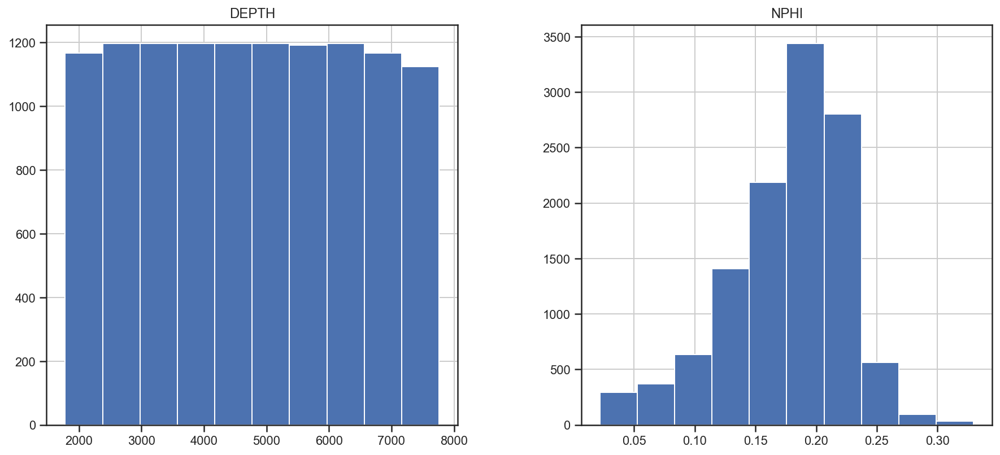

In [22]:
NPHI_Data_MIP.hist(figsize = (15, 15), layout = (2,2))

In [23]:
col_names = list(NPHI_Data_MIP.columns)
print(col_names)

['DEPTH', 'NPHI']


In [24]:
Depth = NPHI_Data_MIP['DEPTH']
Nphi = NPHI_Data_MIP['NPHI']

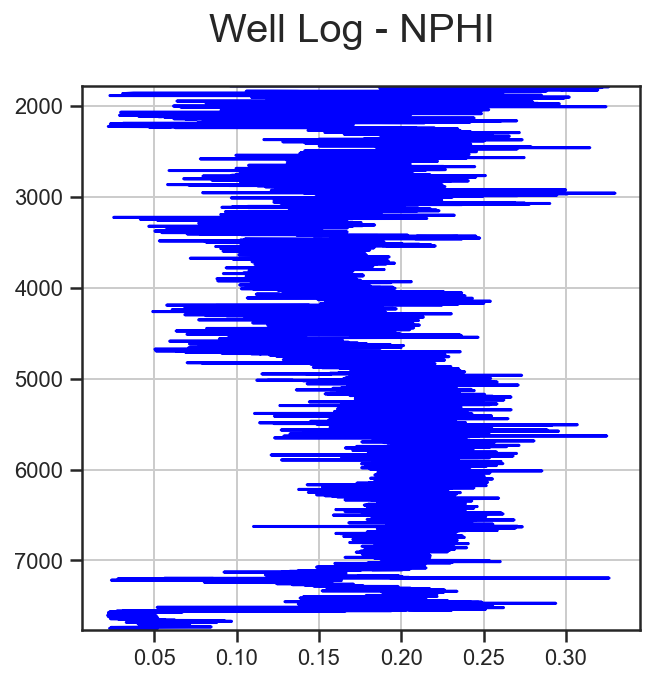

In [25]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - NPHI', size=20)

plt.subplot(1,1,1)
plt.plot(Nphi, Depth, color='blue')
plt.ylim(max(Depth),min(Depth))
plt.grid()

plt.show()

### Drilling Data

In [26]:
drilling_data = pd.read_csv('MIP3H Drilling Data.csv', header = 0)

In [27]:
drilling_data_subset = drilling_data[['DEPTH', 'Rate Of Penetration', 'Rotary Torque', 'Weight on Bit', 'Flow', 'Mechanical Specific Energy']]

In [28]:
drilling_data_subset.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,7044.000000,7044.000000,7044.000000,7044.000000,7044.000000,7044.000000
mean,10367.166809,189.018698,12.370597,26.556601,30.471749,187.944187
std,2029.687641,107.714113,3.521571,9.830599,11.367029,4177.729697
min,6850.000000,0.150000,0.033000,0.000000,2.000000,-999.250000
25%,8611.750000,150.110000,10.642000,24.000000,28.000000,85.900000
50%,10369.500000,209.245000,13.087000,28.300000,29.000000,96.400000
75%,12124.250000,236.245000,14.951000,30.500000,29.000000,113.700000
max,13879.000000,2940.600000,19.020000,101.400000,94.000000,330292.000000


### Matrix Scatter Plot

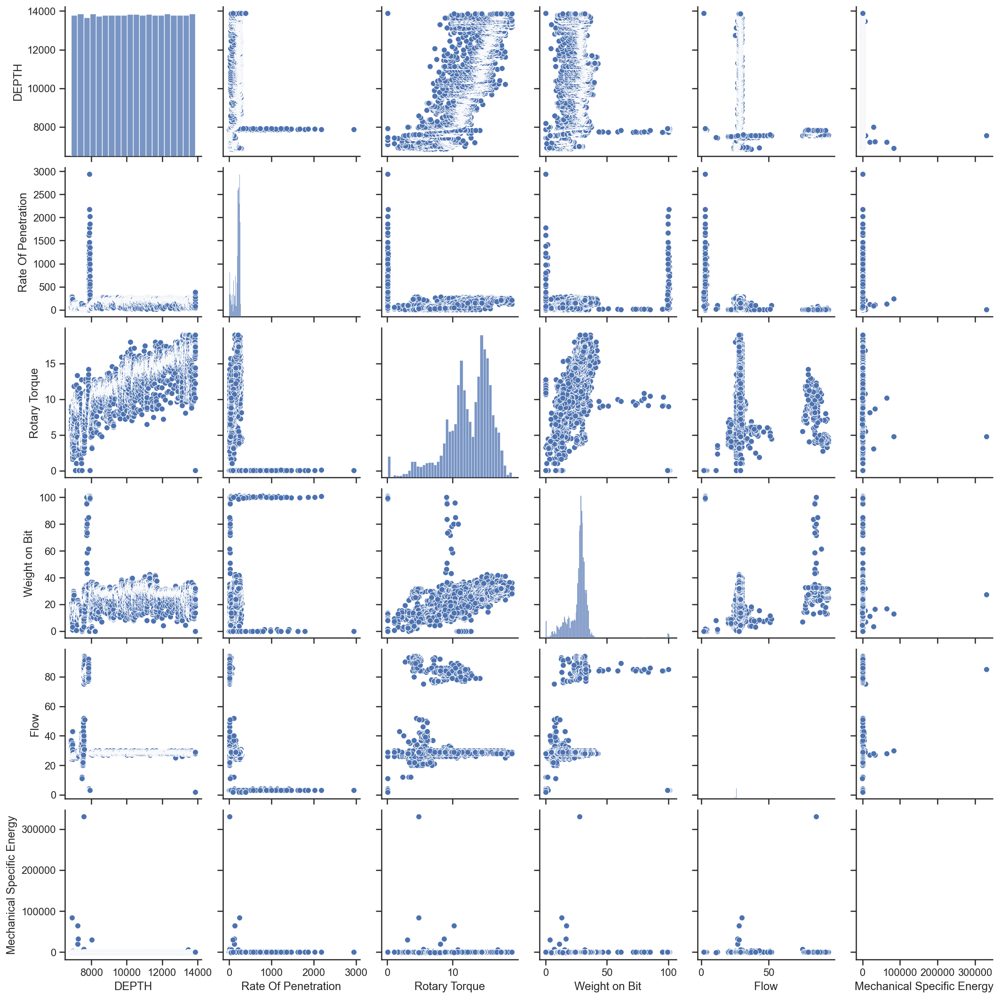

In [29]:
sns.set(style = 'ticks')
sns.pairplot(drilling_data_subset)

### Box Plots

<AxesSubplot:ylabel='Rate Of Penetration'>

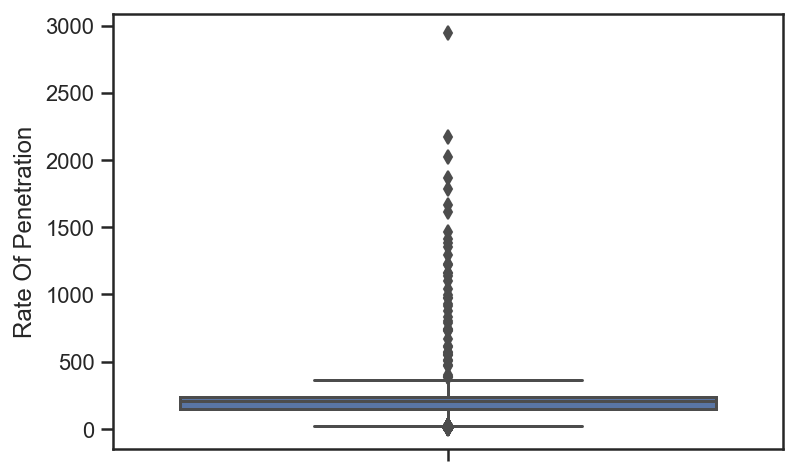

In [30]:
sns.boxplot(y = drilling_data_subset['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

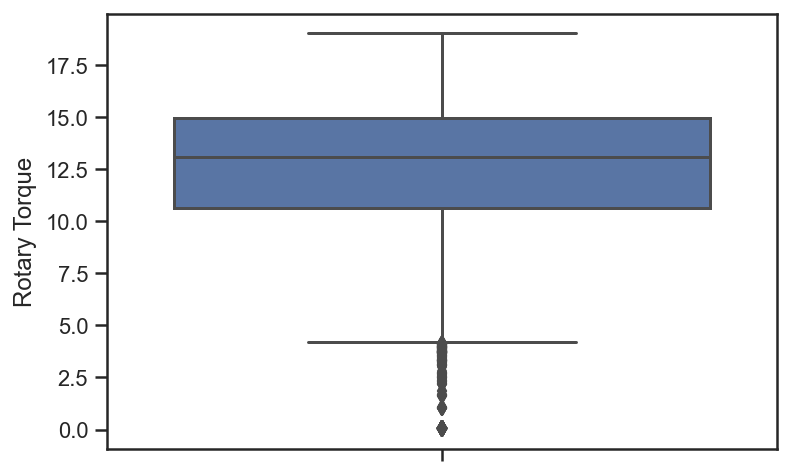

In [31]:
sns.boxplot(y = drilling_data_subset['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

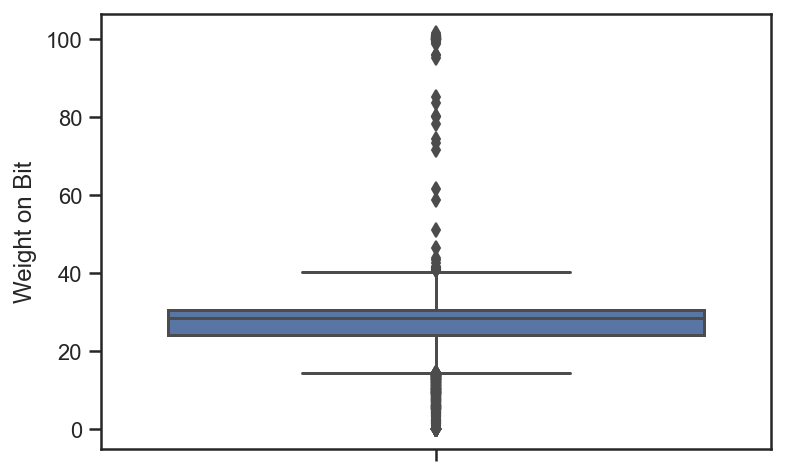

In [32]:
sns.boxplot(y = drilling_data_subset['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

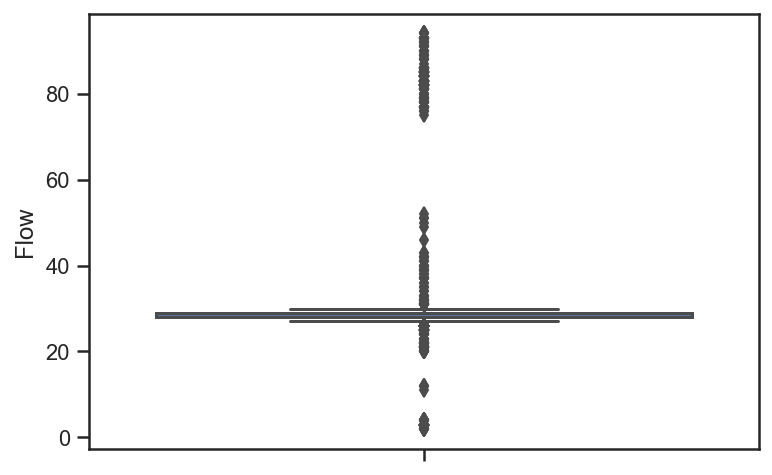

In [33]:
sns.boxplot(y = drilling_data_subset['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

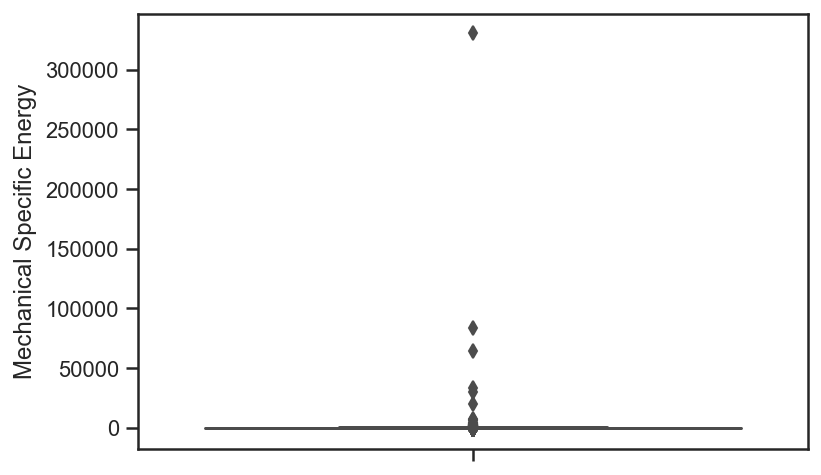

In [34]:
sns.boxplot(y = drilling_data_subset['Mechanical Specific Energy'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

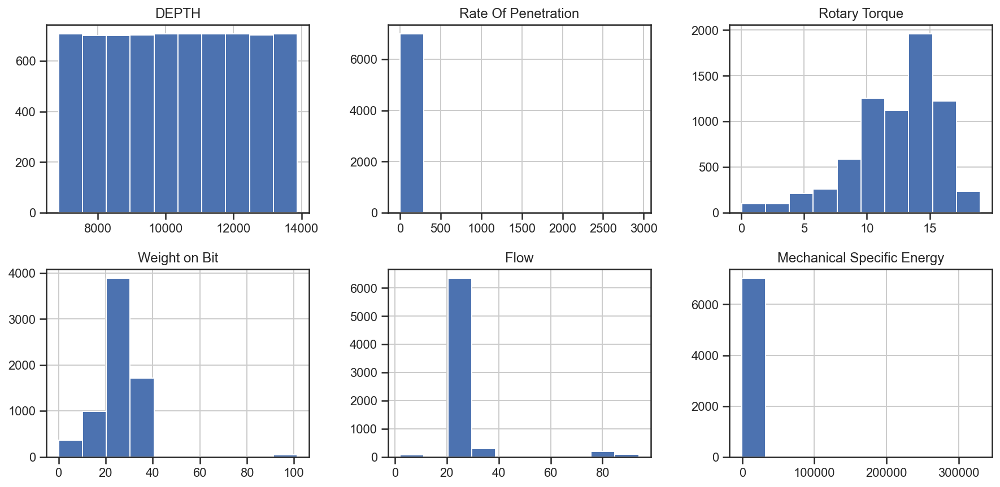

In [35]:
drilling_data_subset.hist(figsize = (15, 15), layout = (4,3))

### Removing Zero ROP, WOB and Negative MSE Values

In [36]:
drillingdata = drilling_data_subset[(drilling_data_subset['Rate Of Penetration'] > 0) & (drilling_data_subset['Weight on Bit'] > 0) &  (drilling_data_subset['Mechanical Specific Energy'] > 0)]
drillingdata.head()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
0,6850,88.51,6.915,16.7,37,354.4
1,6851,62.76,5.960,15.4,32,166.0
2,6852,56.92,8.597,16.1,32,178.7
3,6853,142.70,4.252,13.5,35,101.5
4,6854,142.87,9.054,13.6,32,44.1


In [37]:
drillingdata.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,6596.000000,6596.000000,6596.000000,6596.000000,6596.000000,6596.000000
mean,10506.424803,195.673096,12.636538,27.074378,28.767283,219.599439
std,1981.593868,87.513928,3.384345,9.116901,5.627316,4313.809105
min,6850.000000,2.760000,0.033000,0.300000,3.000000,1.700000
25%,8880.750000,177.767500,10.949000,25.400000,28.000000,88.000000
50%,10543.500000,212.230000,13.527000,28.500000,29.000000,97.700000
75%,12207.250000,237.940000,15.052000,30.600000,29.000000,115.700000
max,13874.000000,2173.500000,19.020000,101.400000,94.000000,330292.000000


### Missing Values

In [38]:
drillingdata.isna().sum() 

DEPTH                         0
Rate Of Penetration           0
Rotary Torque                 0
Weight on Bit                 0
Flow                          0
Mechanical Specific Energy    0
dtype: int64

### Removing Outliers

In [39]:
from scipy import stats

drilling_data_MIP = drillingdata[['DEPTH', 'Rate Of Penetration', 'Rotary Torque', 'Weight on Bit', 'Flow', 'Mechanical Specific Energy']]

drilling_data_MIP = drilling_data_MIP[(np.abs(stats.zscore(drilling_data_MIP)) < 3).all(axis=1)]

drillingdata = drillingdata.merge(drilling_data_MIP,on=['DEPTH','Rate Of Penetration', 'Rotary Torque',  'Weight on Bit', 'Flow', 'Mechanical Specific Energy'])

In [40]:
drilling_data_MIP.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,6465.000000,6465.000000,6465.000000,6465.000000,6465.000000,6465.000000
mean,10565.452127,194.421918,12.845729,26.670131,28.524981,133.285197
std,1956.814967,60.516222,3.062441,6.658779,1.309725,197.449323
min,6850.000000,3.460000,2.525000,0.300000,12.000000,2.200000
25%,8980.000000,180.280000,11.066000,25.600000,28.000000,88.100000
50%,10607.000000,212.710000,13.617000,28.500000,29.000000,97.700000
75%,12240.000000,237.890000,15.086000,30.600000,29.000000,115.000000
max,13874.000000,291.980000,19.020000,42.600000,43.000000,6585.600000


### Matrix Scatter Plots, Box Plots and Histogram after removing Outliners and negative values

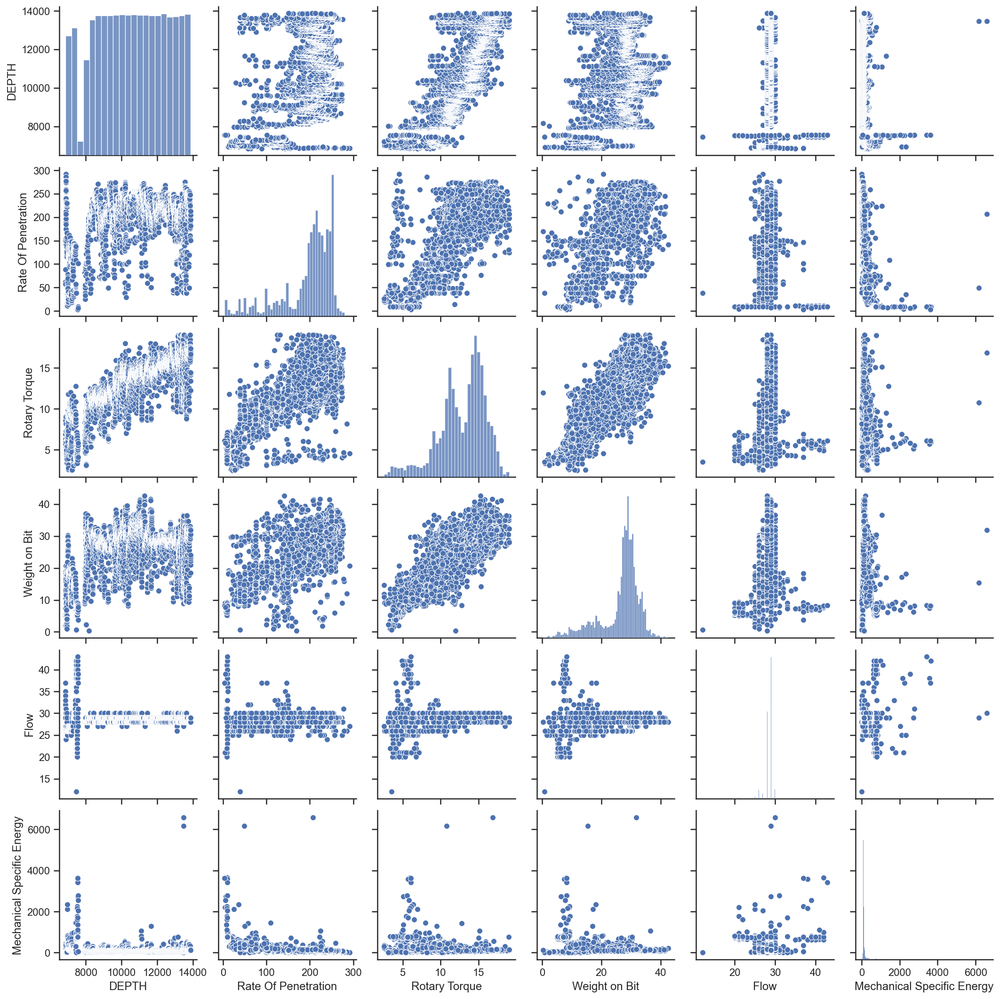

In [41]:
sns.set(style = 'ticks')
sns.pairplot(drilling_data_MIP)

<AxesSubplot:ylabel='Rate Of Penetration'>

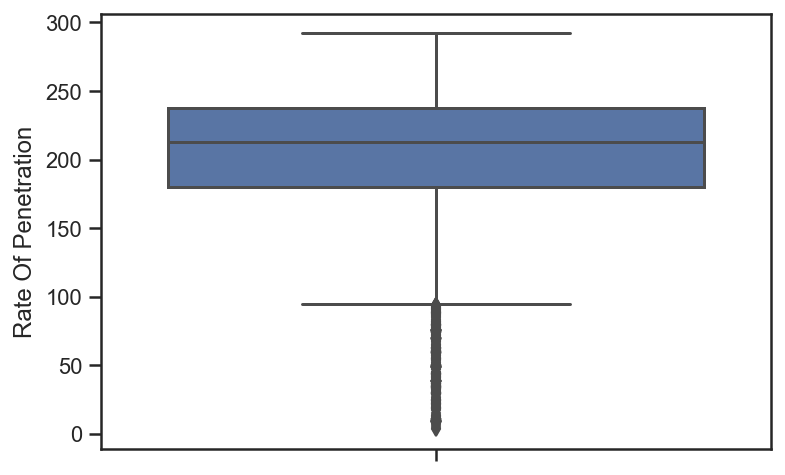

In [42]:
sns.boxplot(y = drilling_data_MIP['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

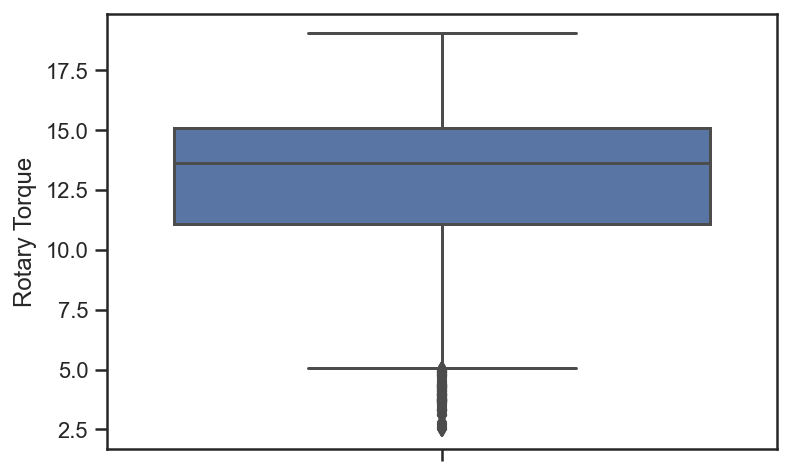

In [43]:
sns.boxplot(y = drilling_data_MIP['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

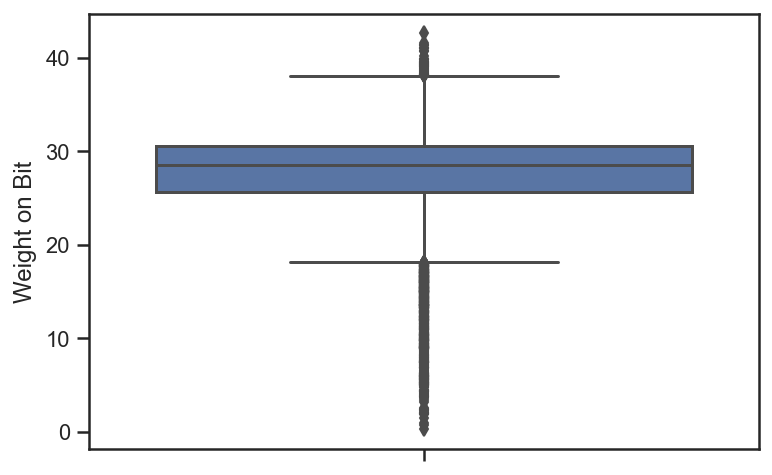

In [44]:
sns.boxplot(y = drilling_data_MIP['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

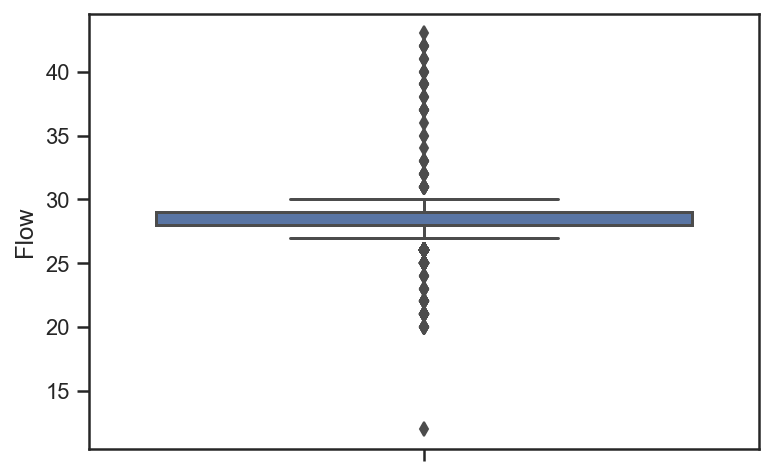

In [45]:
sns.boxplot(y = drilling_data_MIP['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

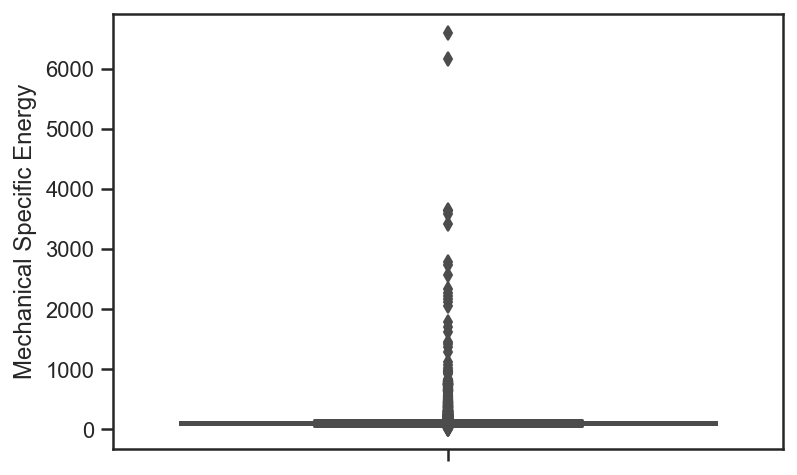

In [46]:
sns.boxplot(y = drilling_data_MIP['Mechanical Specific Energy'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

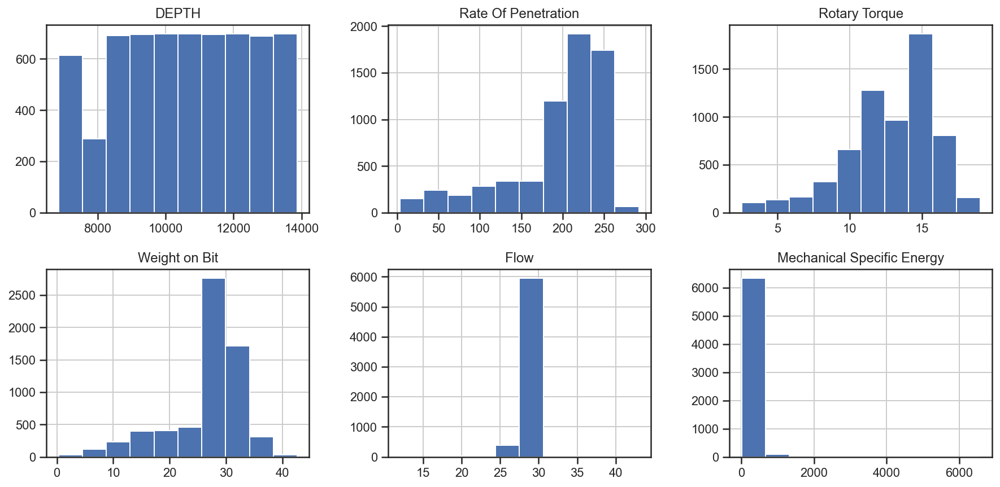

In [47]:
drilling_data_MIP.hist(figsize = (15, 15), layout = (4,3))

### Merged Drilling and NPHI Data

In [48]:
Data = pd.merge(left = drilling_data_MIP, right = NPHI_Data_MIP, left_on = 'DEPTH', right_on = 'DEPTH')
Data.head()

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:1123: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation
  warnings.warn(


,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy,NPHI
0,6850,88.51,6.915,16.7,37,354.4,0.1970
1,6851,62.76,5.960,15.4,32,166.0,0.1869
2,6852,56.92,8.597,16.1,32,178.7,0.1957
3,6853,142.70,4.252,13.5,35,101.5,0.2071
4,6854,142.87,9.054,13.6,32,44.1,0.1918


In [49]:
Data.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy,NPHI
count,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000
mean,7213.606796,92.846392,7.274447,13.966990,27.412621,327.094660,0.184615
std,203.635465,60.014466,2.420948,5.899928,3.696725,454.932292,0.037433
min,6850.000000,3.460000,2.525000,0.700000,12.000000,2.200000,0.027000
25%,7048.250000,33.967500,4.885750,9.100000,26.000000,116.700000,0.165100
50%,7219.500000,108.870000,8.503500,15.000000,26.000000,156.950000,0.192550
75%,7388.750000,132.665000,9.214250,18.200000,29.000000,387.575000,0.208375
max,7558.000000,291.980000,12.771000,30.300000,43.000000,3649.800000,0.326200


In [50]:
Data.isna().sum()

DEPTH                         0
Rate Of Penetration           0
Rotary Torque                 0
Weight on Bit                 0
Flow                          0
Mechanical Specific Energy    0
NPHI                          0
dtype: int64

In [51]:
Data.dropna(how='any', inplace=True)
Data.isnull().sum().sum()

0

In [52]:
Depth = Data['DEPTH']
Nphi = Data['NPHI']

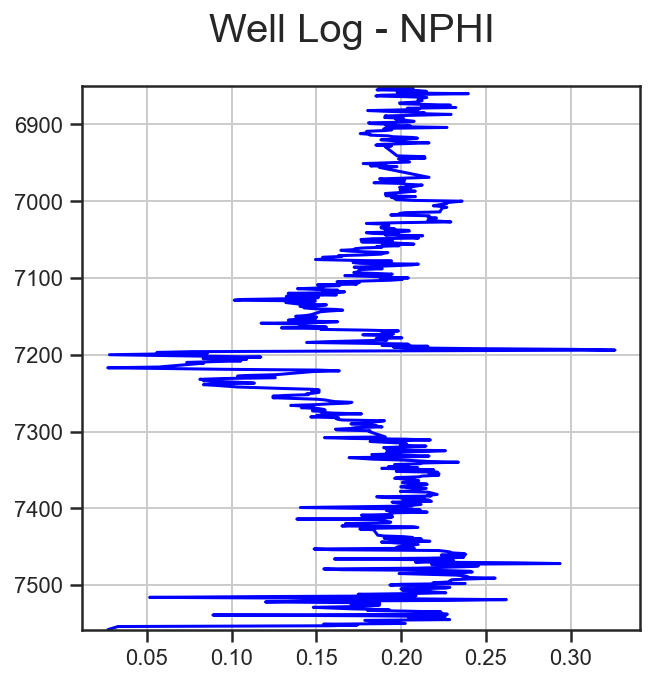

In [53]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - NPHI', size=20)

plt.subplot(1,1,1)
plt.plot(Nphi, Depth, color='blue')
plt.ylim(max(Depth),min(Depth))
plt.grid()

plt.show()

### Matrix Scatter Plot, Box Plot and Histrogram after merging the data

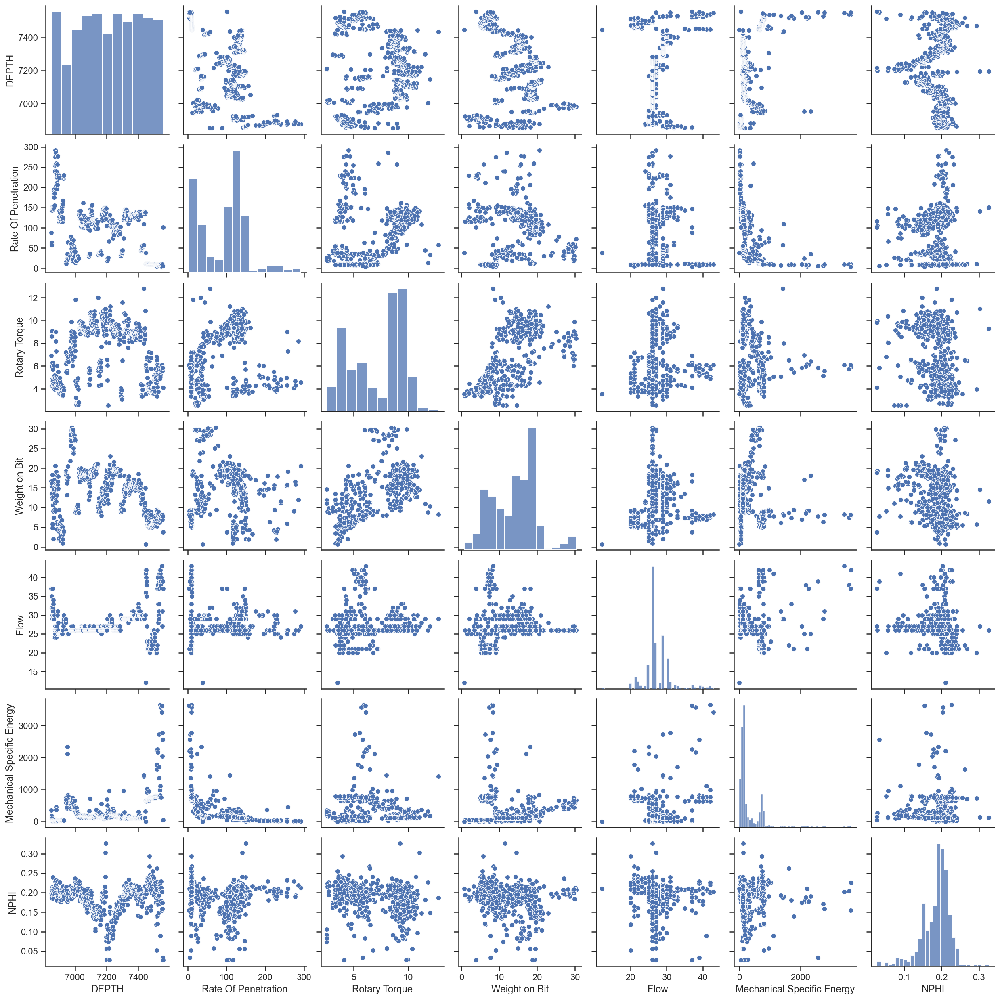

In [54]:
sns.set(style = 'ticks')
sns.pairplot(Data)

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:title={'center':'NPHI'}>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

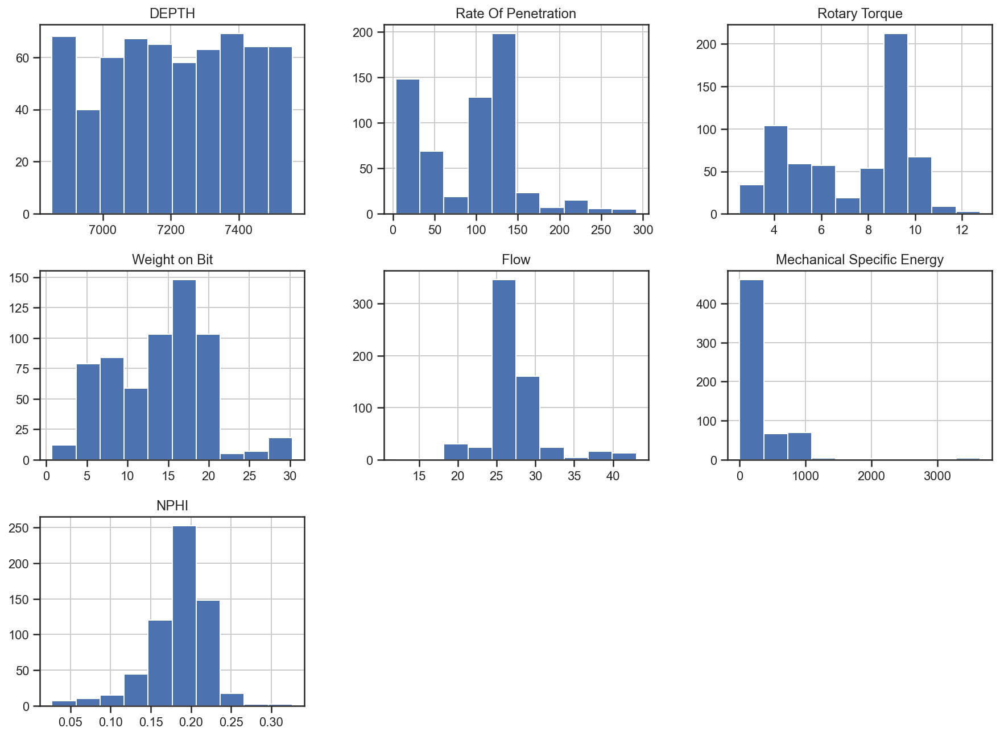

In [55]:
Data.hist(figsize = (15, 15), layout = (4,3))

<AxesSubplot:ylabel='Rate Of Penetration'>

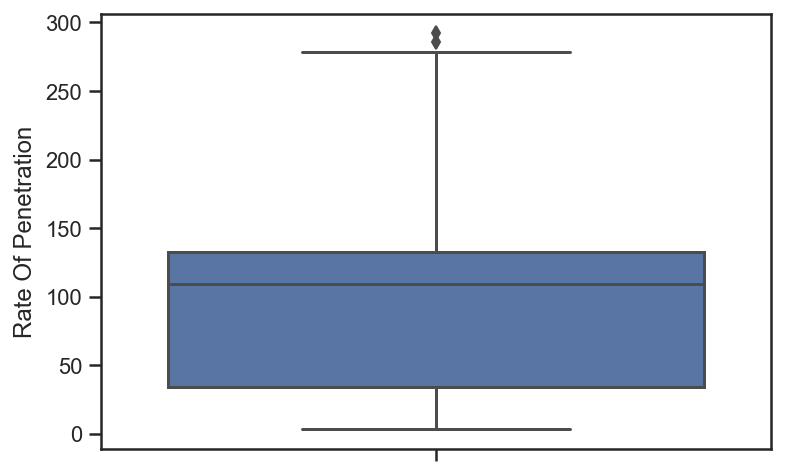

In [56]:
sns.boxplot(y = Data['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

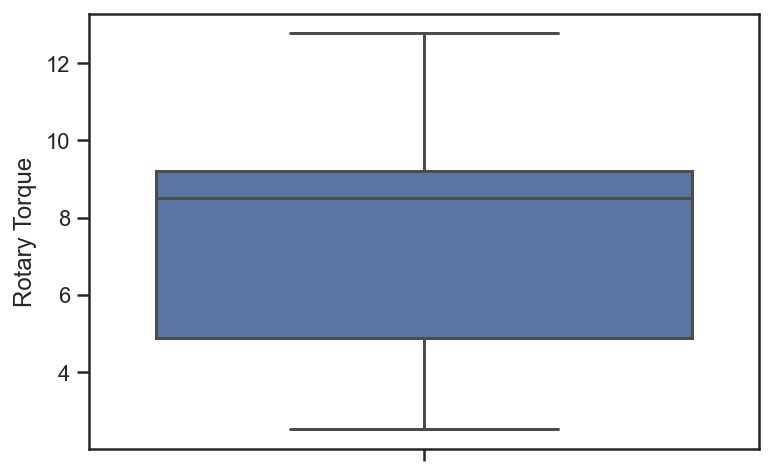

In [57]:
sns.boxplot(y = Data['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

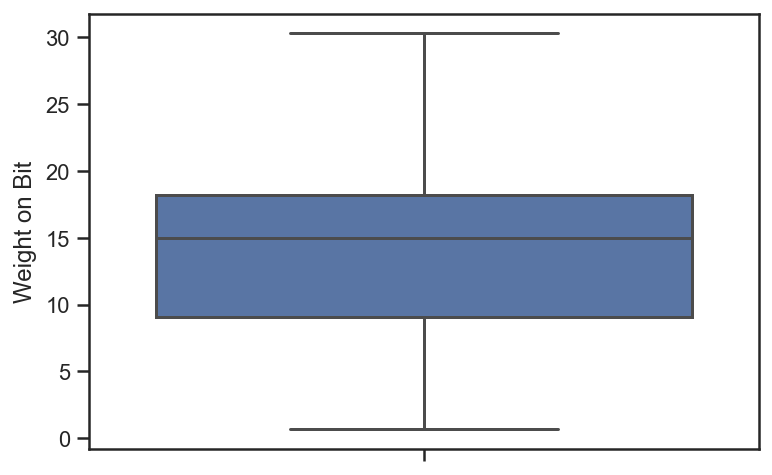

In [58]:
sns.boxplot(y = Data['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

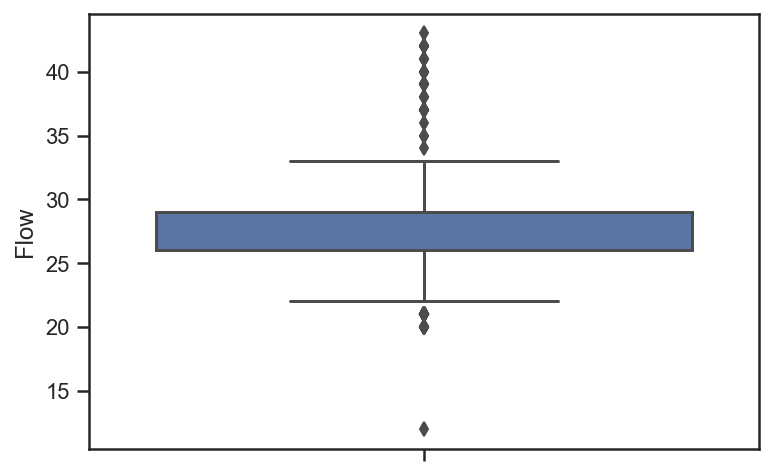

In [59]:
sns.boxplot(y = Data['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

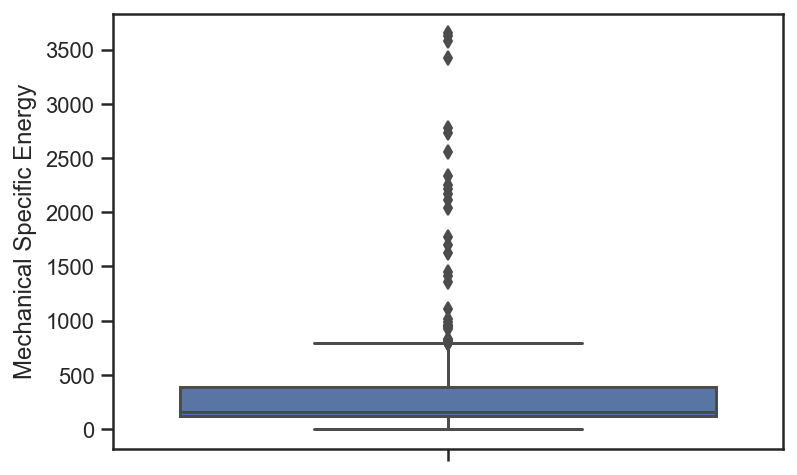

In [60]:
sns.boxplot(y = Data['Mechanical Specific Energy'])

<AxesSubplot:ylabel='NPHI'>

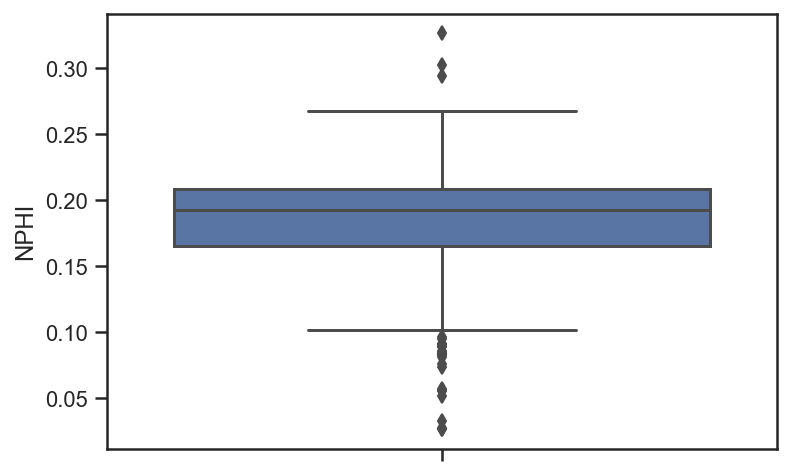

In [61]:
sns.boxplot(y = Data['NPHI'])

### Scaling the Data

In [62]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

# Scaling the input data
input_drillingdata = Data[['DEPTH', 'Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow' ]].to_numpy()
drillingdata_scaled = scaler.fit_transform(input_drillingdata)
drillingdata_scaled_df = pd.DataFrame (drillingdata_scaled , columns = ['DEPTH','Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow'])

# Keeping the output data separate
NPHI_raw = Data[['NPHI']].to_numpy()
NPHI_raw_df = pd.DataFrame(NPHI_raw, columns = ['NPHI'])

drillingdata_scaled_df['NPHI'] = NPHI_raw_df

In [63]:
drillingdata_scaled_df.isnull().sum().sum()

0

### Train/Test Split

In [64]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(drillingdata_scaled_df, test_size = 0.15, random_state = 12 )

In [65]:
x_train_1 = train.drop('NPHI', axis=1) 
y_train_1 = train['NPHI']              

x_test_1 = test.drop('NPHI', axis = 1) 
y_test_1 = test['NPHI']

In [66]:
print("TRAINING DATA")
print("Size of x_train_1 is:", x_train_1.shape)
print("Size of y_train_1 is:", y_train_1.shape)
print("TEST DATA")
print("Size of x_test_1 is:", x_test_1.shape)
print("Size of y_test_1 is:", y_test_1.shape)

TRAINING DATA
Size of x_train_1 is: (525, 6)
Size of y_train_1 is: (525,)
TEST DATA
Size of x_test_1 is: (93, 6)
Size of y_test_1 is: (93,)


### Random Forest Regression

In [67]:
x_train_rf_1 = x_train_1.copy()
x_test_rf_1 = x_test_1.copy()
y_train_rf_1 = y_train_1.copy()
y_test_rf_1 = y_test_1.copy()

In [68]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 

eps = 0.1
rfr= RandomForestRegressor(n_estimators=500, max_depth=10)

rfr.fit(x_train_rf_1, y_train_rf_1)

RandomForestRegressor(max_depth=10, n_estimators=500)

In [70]:
y_pred_rf_1 = rfr.predict(x_test_rf_1)
test_R2 = rfr.score(x_test_rf_1, y_test_rf_1)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf_1 - y_pred_rf_1  < eps) / len(y_test_rf_1)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.5796148718216236
Percentage within Epsilon = 100.00%


Text(0.5, 1.0, 'TestR2 = 0.579615')

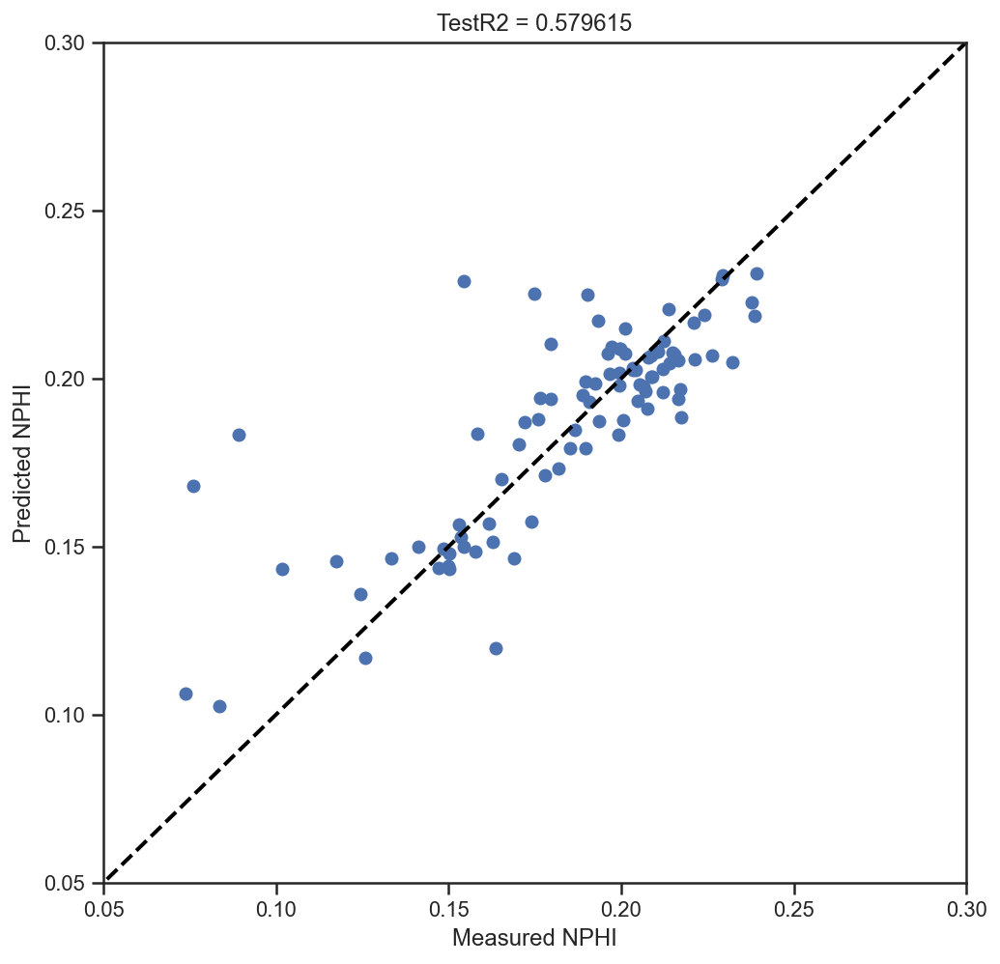

In [71]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_rf_1, y_pred_rf_1)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 
plt.title('TestR2 = %f'%(test_R2))

### Error and Accuracy: Random Forest

In [72]:
NPHI_RandomForest_1 = pd.DataFrame({ 'Measured NPHI':y_test_rf_1, 'Predicted NPHI':y_pred_rf_1})
NPHI_RandomForest_1.head()


,Measured NPHI,Predicted NPHI
285,0.2047,0.193195
150,0.1907,0.193088
122,0.2242,0.218844
594,0.1719,0.186996
20,0.2087,0.206926


In [73]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf_1, y_pred_rf_1))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf_1, y_pred_rf_1))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf_1, y_pred_rf_1)))

Mean Absolute Error: 0.016388586949029813
Mean Squared Error: 0.000755682189177216
Root Mean Squared Error: 0.027489674228284626


In [74]:
# Calculate the absolute errors
errors = abs(y_pred_rf_1 - y_test_rf_1)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf_1)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 82.62 %.


### Variable Importance

In [75]:
# Get numerical feature importances
importances = list(rfr.feature_importances_)

In [76]:
feature_list=list(Data[['DEPTH','Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow']].columns)

feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: DEPTH                Importance: 0.59
Variable: Rate Of Penetration  Importance: 0.12
Variable: Weight on Bit        Importance: 0.11
Variable: Rotary Torque        Importance: 0.08
Variable: Mechanical Specific Energy Importance: 0.06
Variable: Flow                 Importance: 0.05


<AxesSubplot:xlabel='Importance', ylabel='Features'>

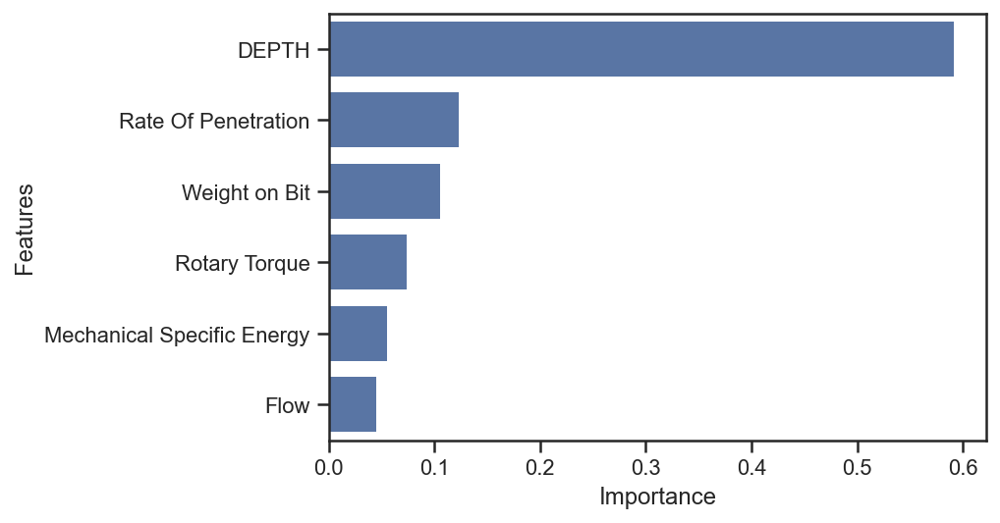

In [77]:
feature_dataframe = pd.DataFrame(data = feature_list, columns = ['Features'])
feature_dataframe['Importance'] = importances

sns.set(style = 'ticks')
sns.barplot(x = 'Importance', y = 'Features', data = feature_dataframe, color="b")


### Scaling the Data: Removing Flow 

In [78]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

# Scaling the input data
input_drillingdata = Data[['DEPTH', 'Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy']].to_numpy()
drillingdata_scaled = scaler.fit_transform(input_drillingdata)
drillingdata_scaled_df = pd.DataFrame (drillingdata_scaled , columns = ['DEPTH','Rate Of Penetration', 'Weight on Bit', 'Rotary Torque','Mechanical Specific Energy'])

# Keeping the output data separate
NPHI_raw = Data[['NPHI']].to_numpy()
NPHI_raw_df = pd.DataFrame(NPHI_raw, columns = ['NPHI'])

drillingdata_scaled_df['NPHI'] = NPHI_raw_df

In [79]:
drillingdata_scaled_df.isnull().sum().sum()

0

### New Train/Test Split

In [80]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(drillingdata_scaled_df, test_size = 0.15, random_state = 12 )

In [81]:
x_train = train.drop('NPHI', axis=1) 
y_train = train['NPHI']              

x_test = test.drop('NPHI', axis = 1) 
y_test = test['NPHI']

In [82]:
print("TRAINING DATA")
print("Size of x_train is:", x_train.shape)
print("Size of y_train is:", y_train.shape)
print("TEST DATA")
print("Size of x_test is:", x_test.shape)
print("Size of y_test is:", y_test.shape)

TRAINING DATA
Size of x_train is: (525, 5)
Size of y_train is: (525,)
TEST DATA
Size of x_test is: (93, 5)
Size of y_test is: (93,)


### Random Forest Regression

In [83]:
x_train_rf = x_train.copy()
x_test_rf = x_test.copy()
y_train_rf = y_train.copy()
y_test_rf = y_test.copy()

In [84]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 

eps = 0.1
rfr= RandomForestRegressor(n_estimators=500, max_depth=10)

rfr.fit(x_train_rf, y_train_rf)

RandomForestRegressor(max_depth=10, n_estimators=500)

In [85]:
y_pred_rf = rfr.predict(x_test_rf)
test_R2 = rfr.score(x_test_rf, y_test_rf)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf - y_pred_rf  < eps) / len(y_test_rf)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.6017193853141004
Percentage within Epsilon = 100.00%


Text(0.5, 1.0, 'TestR2 = 0.601719')

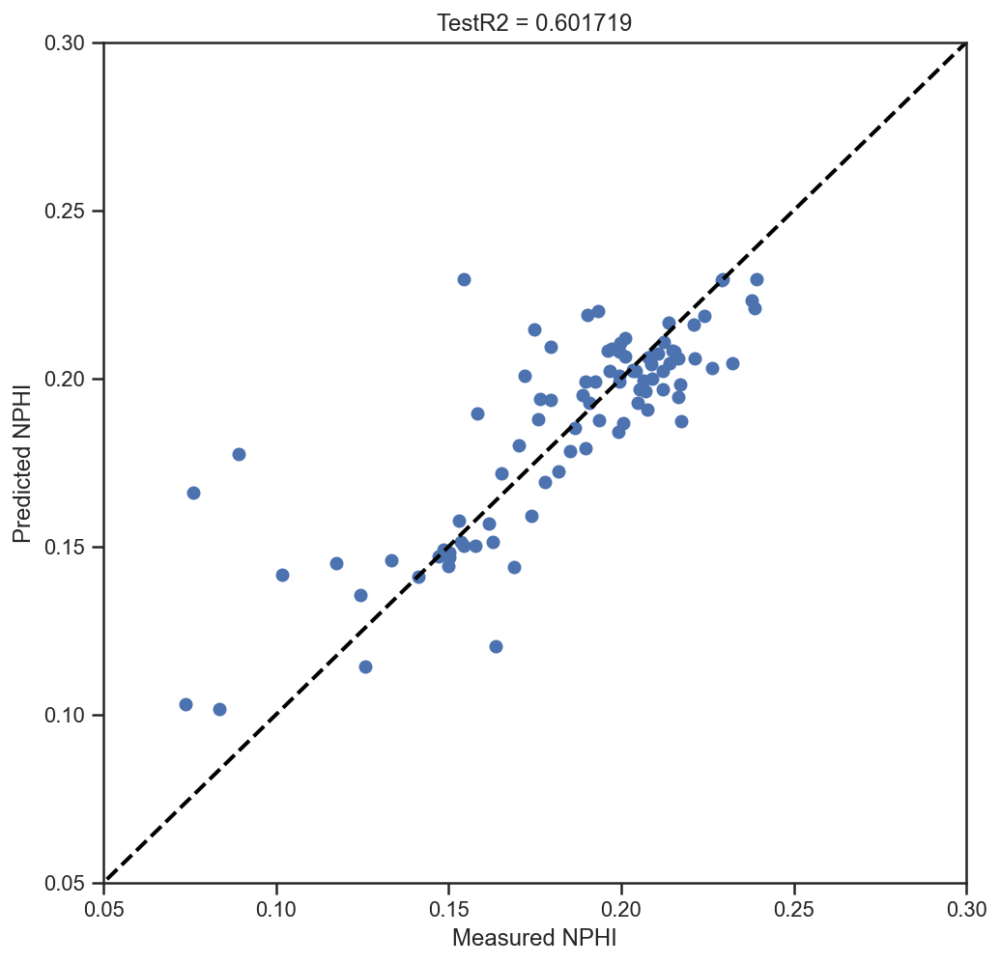

In [86]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_rf, y_pred_rf)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 
plt.title('TestR2 = %f'%(test_R2))

### Error and Accuracy: Random Forest

In [87]:
NPHI_RandomForest = pd.DataFrame({ 'Measured NPHI':y_test_rf, 'Predicted NPHI':y_pred_rf})
NPHI_RandomForest.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.192739
150,0.1907,0.192644
122,0.2242,0.218691
594,0.1719,0.200795
20,0.2087,0.206665


In [88]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)))

Mean Absolute Error: 0.01601205892864996
Mean Squared Error: 0.0007159472270507624
Root Mean Squared Error: 0.026757190193493083


In [89]:
# Calculate the absolute errors
errors = abs(y_pred_rf - y_test_rf)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 83.13 %.


### Hyperparameter optimization for the RF

In [90]:
from sklearn.model_selection import KFold

cv = KFold(n_splits=10, shuffle = True, random_state=125)

In [91]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': [200, 500, 1000, 2000], 'max_depth': [3,4,5,6], 'min_samples_split': [5,10,15]} # dictionary with keys

grid = GridSearchCV(rfr, param_grid=param_grid, cv=cv, verbose=3) 

In [92]:
grid.fit(x_train_rf, y_train_rf)

Fitting 10 folds for each of 48 candidates, totalling 480 fits
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.529, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.551, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.372, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.346, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.321, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.480, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.560, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.520, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=

[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.474, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.562, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.541, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.640, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.444, total=   0.5s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.525, total=   0.9s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=100

[CV]  max_depth=3, min_samples_split=15, n_estimators=1000, score=0.642, total=   0.9s
[CV] max_depth=3, min_samples_split=15, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=1000, score=0.450, total=   0.9s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.528, total=   1.9s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.549, total=   1.9s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.381, total=   1.9s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.338, total=   1.9s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimator

[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.587, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.479, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.338, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.384, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.564, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.624, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200,

[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.393, total=   0.5s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.557, total=   0.5s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.626, total=   0.5s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.570, total=   0.5s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.681, total=   0.5s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.416, total=   0.6s
[CV] max_depth=4, min_samples_split=15, n_estimators=1000 ............
[CV]  max_depth=4, min_samples_split=15, n_estimators=1000

[CV]  max_depth=5, min_samples_split=5, n_estimators=1000, score=0.532, total=   1.1s
[CV] max_depth=5, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=1000, score=0.691, total=   1.1s
[CV] max_depth=5, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=1000, score=0.356, total=   1.1s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.693, total=   2.2s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.661, total=   2.2s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.485, total=   2.1s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000,

[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.703, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.660, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.491, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.380, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.418, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.609, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200,

[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.400, total=   0.6s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.478, total=   0.6s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.652, total=   0.6s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.712, total=   0.6s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.551, total=   0.6s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.708, total=   0.6s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=

[CV]  max_depth=6, min_samples_split=10, n_estimators=1000, score=0.687, total=   1.2s
[CV] max_depth=6, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=1000, score=0.585, total=   1.2s
[CV] max_depth=6, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=1000, score=0.708, total=   1.2s
[CV] max_depth=6, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=1000, score=0.402, total=   1.2s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=2000, score=0.733, total=   2.4s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=2000, score=0.702, total=   2.4s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimator

[CV]  max_depth=6, min_samples_split=15, n_estimators=2000, score=0.709, total=   2.4s
[CV] max_depth=6, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=15, n_estimators=2000, score=0.424, total=   2.4s


[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:  7.9min finished


GridSearchCV(cv=KFold(n_splits=10, random_state=125, shuffle=True),
             estimator=RandomForestRegressor(max_depth=10, n_estimators=500),
             param_grid={'max_depth': [3, 4, 5, 6],
                         'min_samples_split': [5, 10, 15],
                         'n_estimators': [200, 500, 1000, 2000]},
             verbose=3)

In [93]:
print(grid.best_params_) 
print("score", grid.score(x_test_rf,y_test_rf)) 

{'max_depth': 6, 'min_samples_split': 15, 'n_estimators': 1000}
score 0.5763873346398085


In [94]:
import pandas as pd

cv_results = pd.DataFrame(grid.cv_results_)

# generate a subset of the table
cv_results_tiny = cv_results[['param_max_depth', 'param_min_samples_split', 'mean_test_score','std_test_score']]

# rank them based on test scores
cv_results_tiny.sort_values(by='mean_test_score', ascending=False).head(5)

,param_max_depth,param_min_samples_split,mean_test_score,std_test_score
46,6,15,0.591635,0.122054
47,6,15,0.589263,0.124292
41,6,10,0.588890,0.120739
45,6,15,0.588488,0.126354
42,6,10,0.587419,0.119641


## Reapply the RF with optimal parameters again

In [154]:
grid_new=grid.best_estimator_

In [155]:
print('memorization performance: ', grid_new.score(x_train_rf,y_train_rf)) # memorization

print('generalization performance: ', grid_new.score(x_test_rf,y_test_rf))  # generalization

memorization performance:  0.7921856675695036
generalization performance:  0.5763873346398085


In [156]:
y_pred_rfop = grid_new.predict(x_test_rf)

In [157]:
y_pred_rfop = rfr.predict(x_test_rf)
test_R2 = rfr.score(x_test_rf, y_test_rf)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf - y_pred_rfop  < eps) / len(y_test_rf)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.6017193853141004
Percentage within Epsilon = 100.00%


Text(0.5, 1.0, 'TestR2 = 0.601719')

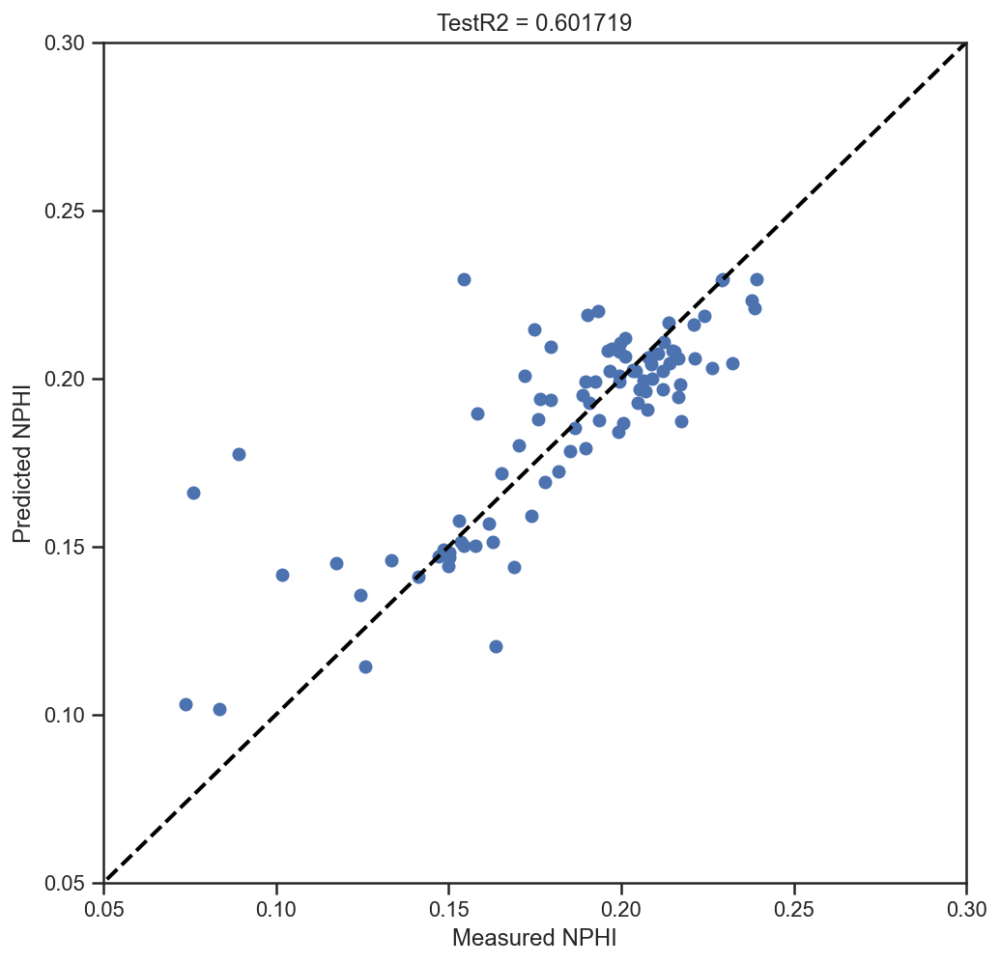

In [158]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_rf, y_pred_rfop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 
plt.title('TestR2 = %f'%(test_R2))

In [99]:
NPHI_RandomForest_OP = pd.DataFrame({'Measured NPHI':y_test_rf, 'Predicted NPHI':y_pred_rfop})
NPHI_RandomForest_OP.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.186024
150,0.1907,0.195485
122,0.2242,0.210834
594,0.1719,0.205421
20,0.2087,0.204670


In [100]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_rfop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_rfop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rfop)))

Mean Absolute Error: 0.017312111531219528
Mean Squared Error: 0.0007614839937600128
Root Mean Squared Error: 0.027594999433955655


In [101]:
# Calculate the absolute errors
errors = abs(y_pred_rfop - y_test_rf)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 82.16 %.


### KNN Regression with K Neighbors

In [102]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

from sklearn import neighbors
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [103]:
x_train_knn = x_train.copy()
x_test_knn = x_test.copy()
y_train_knn = y_train.copy()
y_test_knn = y_test.copy()

<ipython-input-104-5f9aa8995a7a>:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(K, figsize=(6, 6))


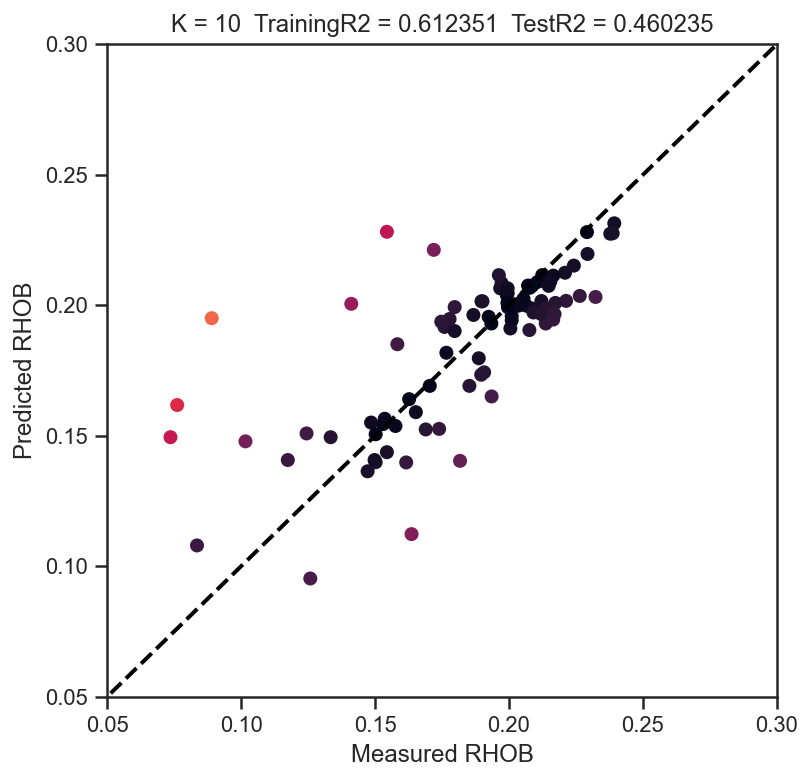

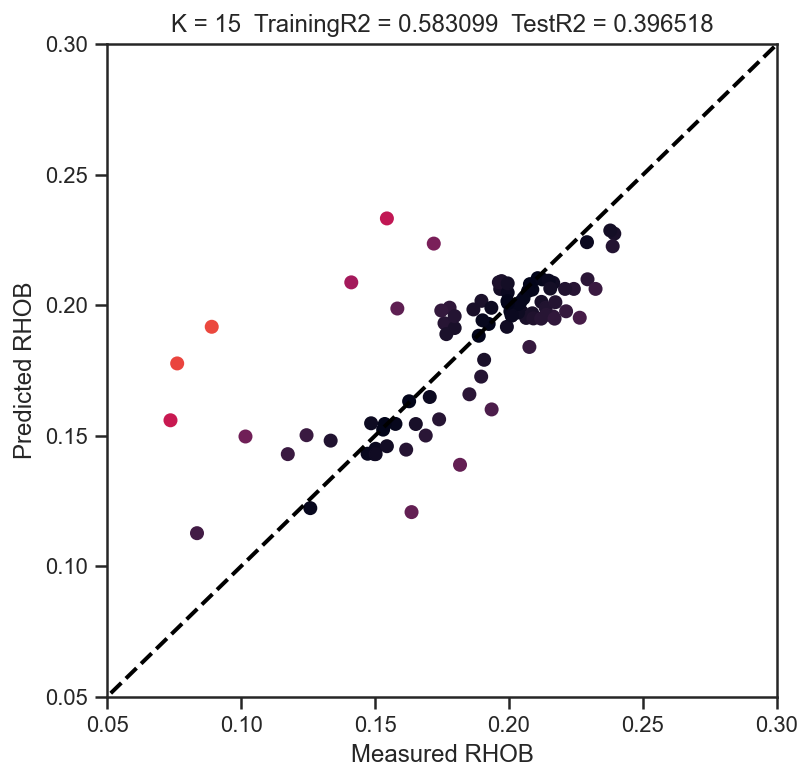

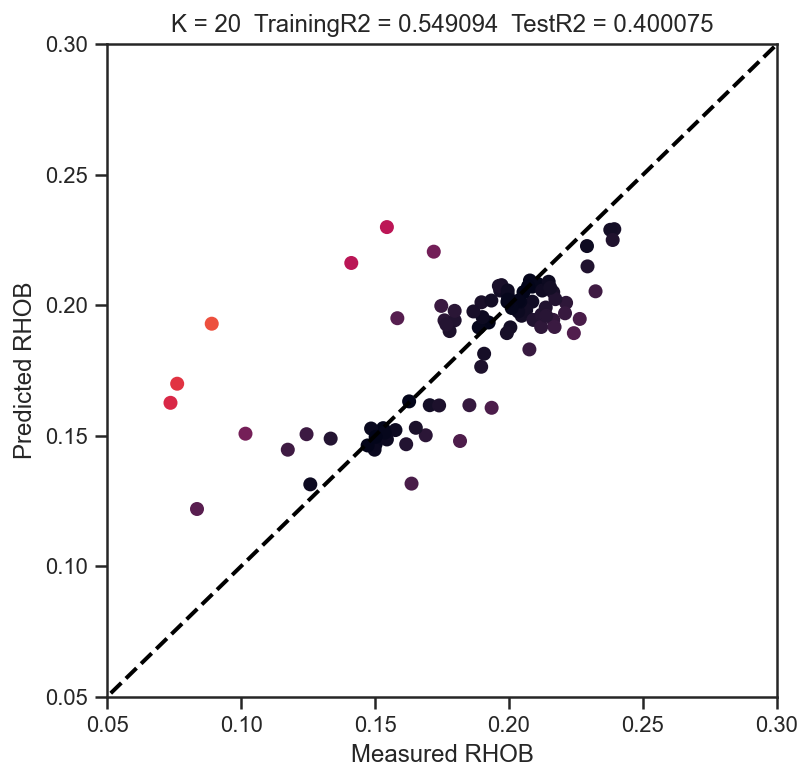

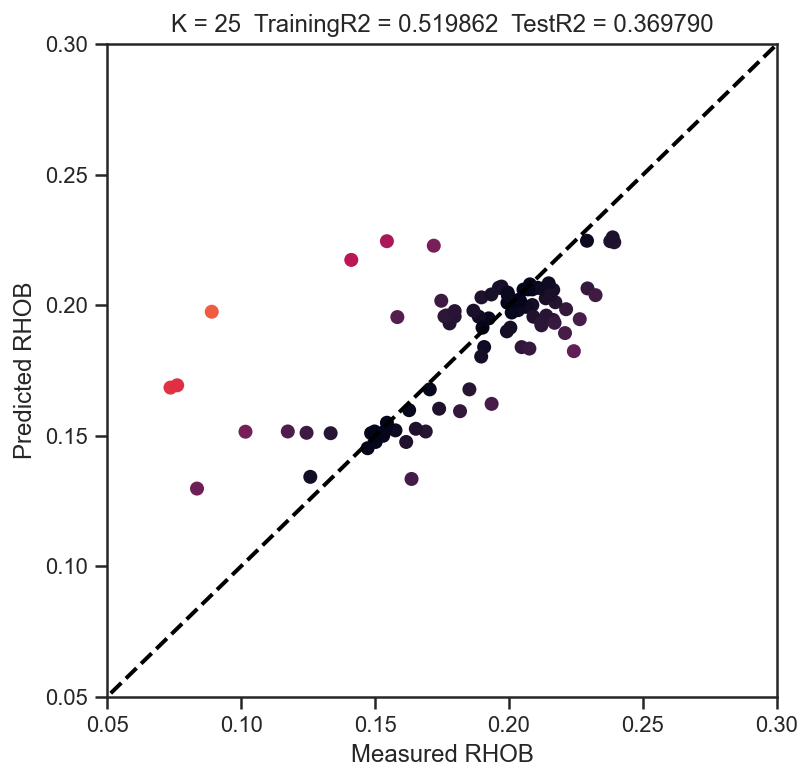

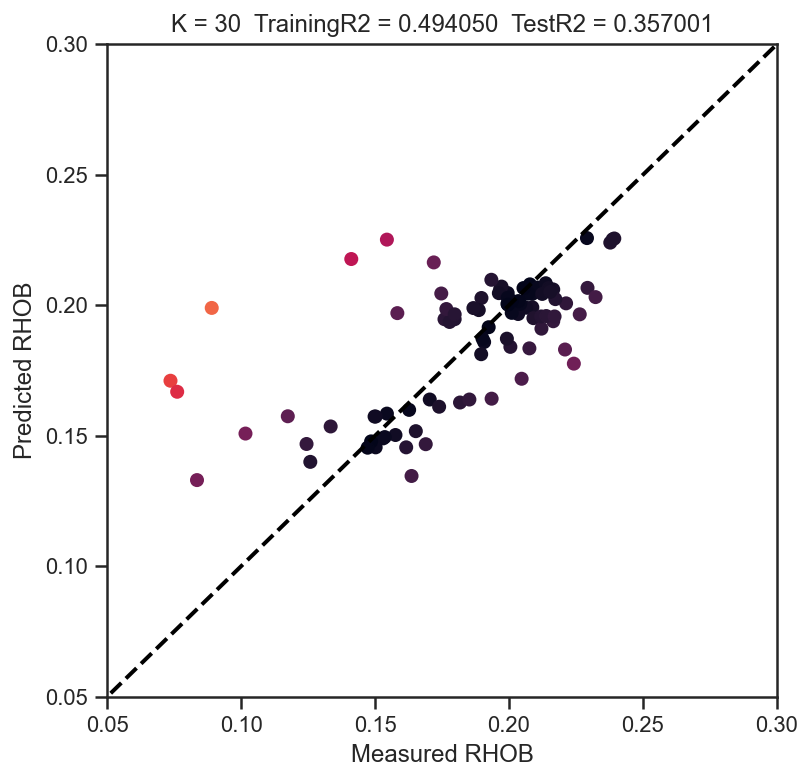

...

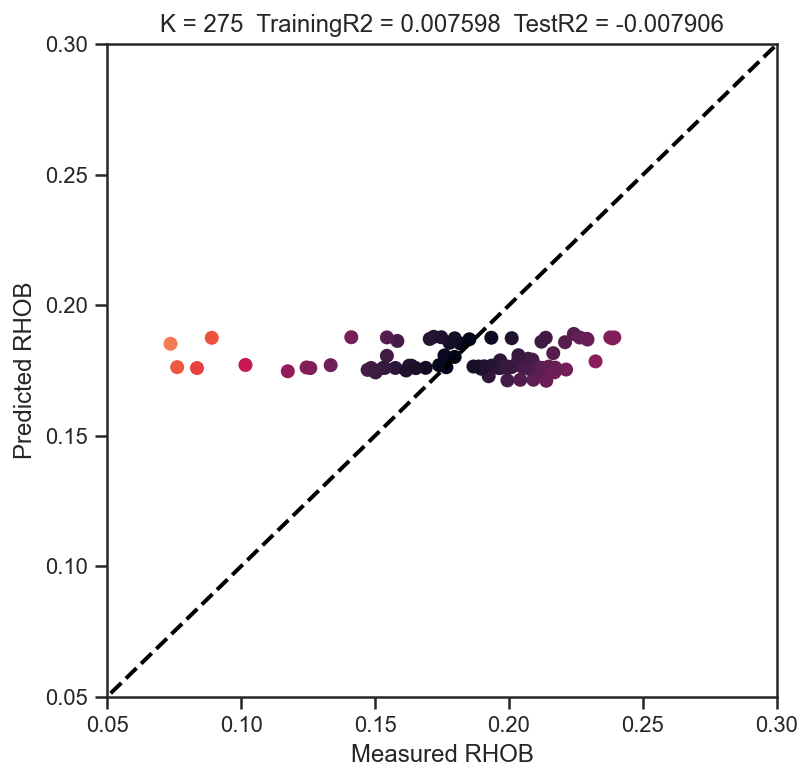

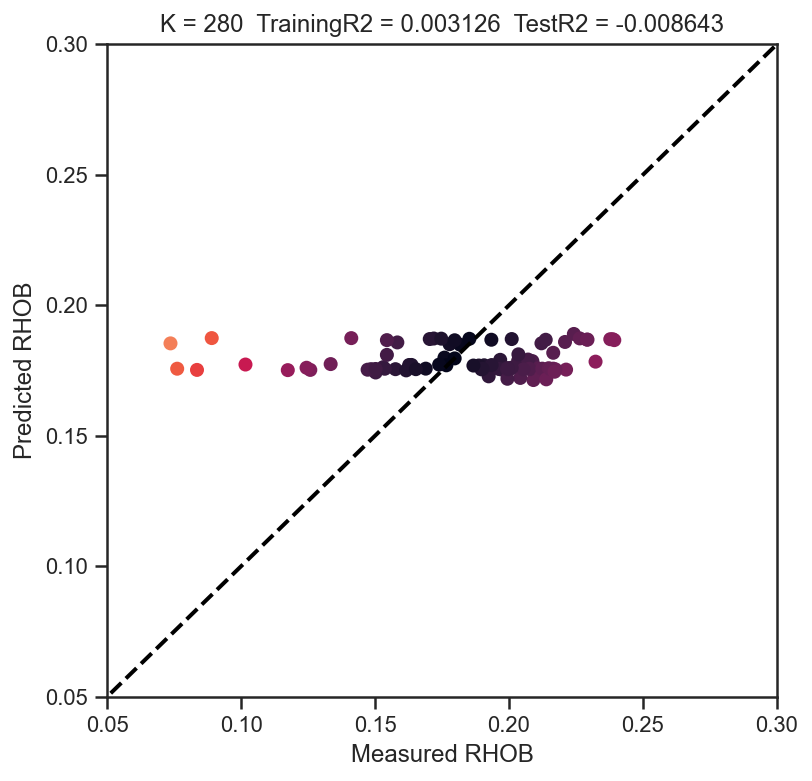

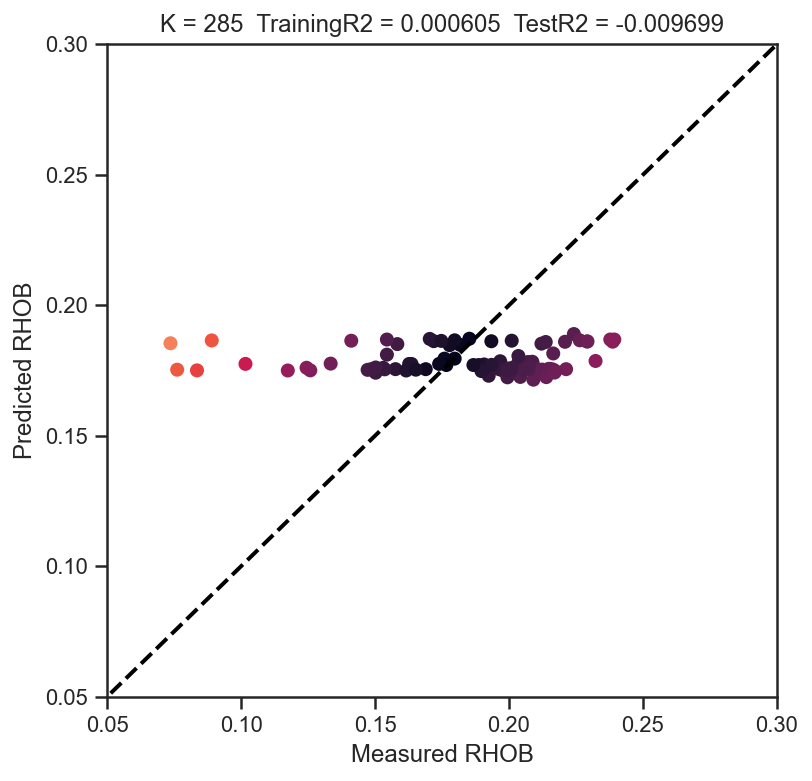

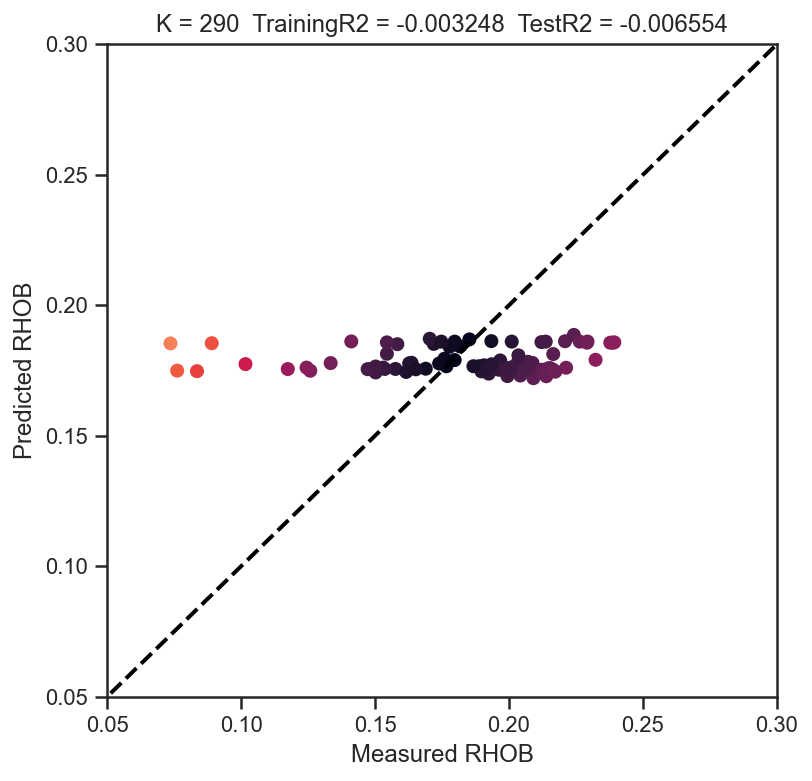

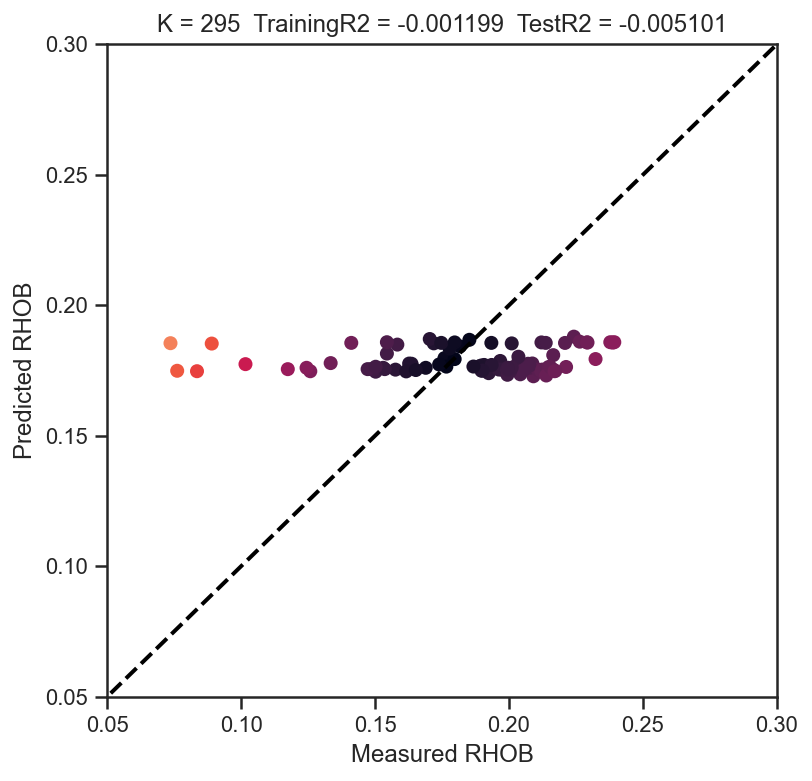

In [104]:
#import required packages
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt


rmse_val = [] # To store rmse values for different k
k_val = []    # To store values of K
R2 = []       # To store R2

for K in range(10, 300, 5):

    k_val.append(K)
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(x_train_knn, y_train_knn)  # fit the model
    y_pred_knn = model.predict(x_test_knn) # make prediction on test set
    
    training_R2 = model.score(x_train_knn, y_train_knn) # Compute training R2
    test_R2 = model.score(x_test_knn, y_test_knn)       # Compute test R2
    R2.append(test_R2)
    
    error = sqrt(mean_squared_error(y_test_knn, y_pred_knn)) #calculate rmse
    rmse_val.append(error)                         #store rmse values
    er=abs(y_test_knn - y_pred_knn)  
   
    # Also create a series of plots for predicted versus actual DT for different values of K
    fig = plt.figure(K, figsize=(6, 6))
    plt.axis([0.05, 0.3, 0.05, 0.3])
    plt.scatter(y_test_knn, y_pred_knn, c = er)
    plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
    plt.ylabel('Predicted RHOB') # Predicted values on y axis
    plt.xlabel('Measured RHOB') 
    plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, training_R2, test_R2))




### Finding Optimal Value of K

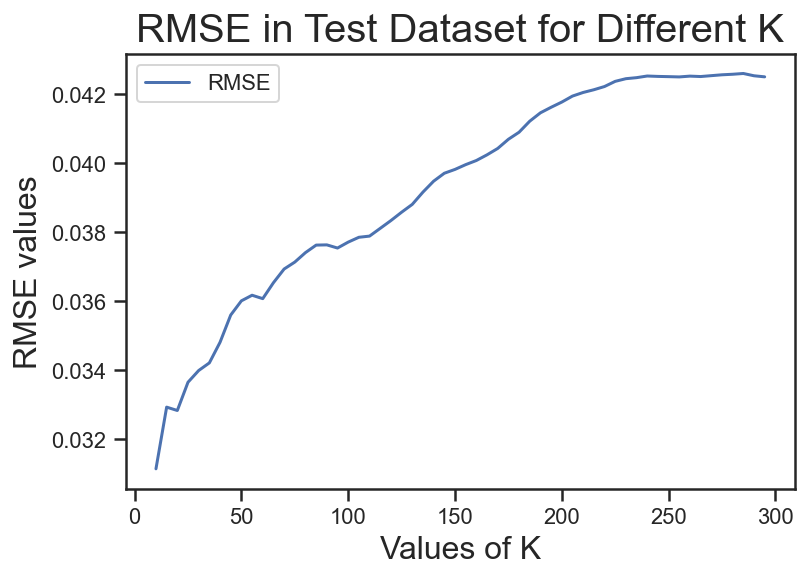

In [105]:
#plotting the rmse values against k values
plt.plot(k_val, rmse_val, label = 'RMSE')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('RMSE values', fontsize = 16)
plt.title ('RMSE in Test Dataset for Different K', fontsize = 20)
plt.legend()

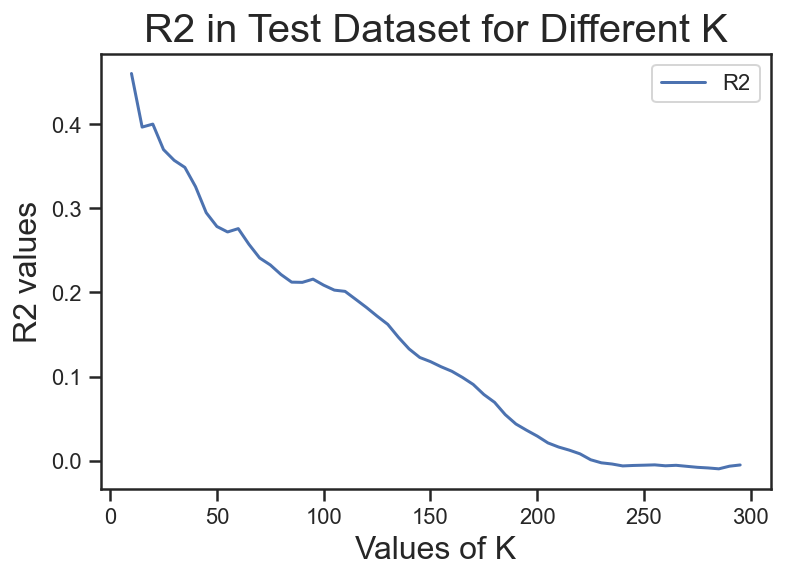

In [106]:
#plotting the rmse values against k values
plt.plot(k_val, R2, label = 'R2')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('R2 values', fontsize = 16)
plt.title ('R2 in Test Dataset for Different K', fontsize = 20)
plt.legend()

### Using Optimal Value of K

Text(0.5, 1.0, 'K = 5  TrainingR2 = 0.700488  TestR2 = 0.497021')

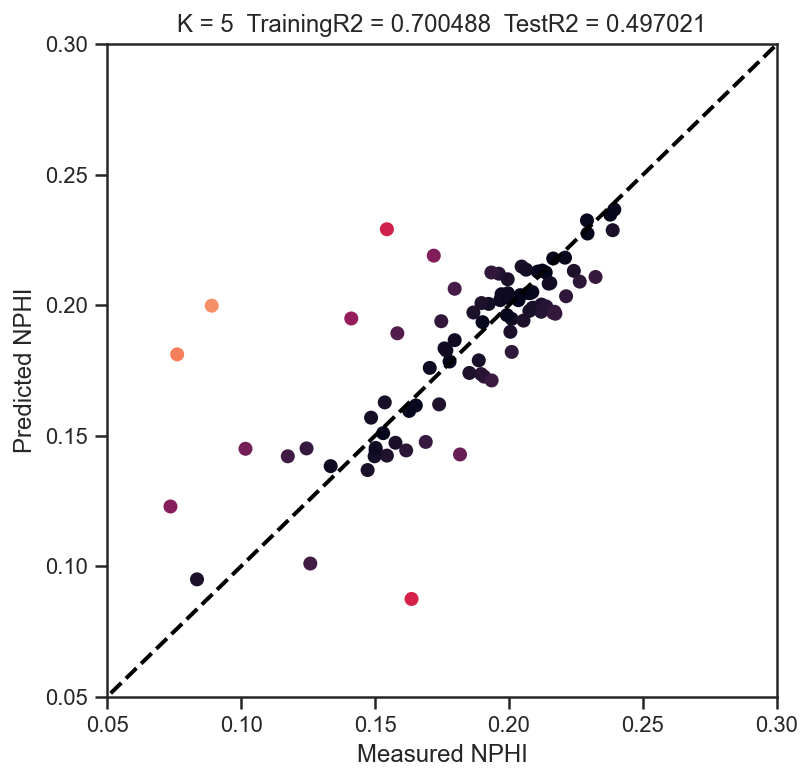

In [162]:
rmse_val = [] # To store rmse values for different k
k_val = []    # To store values of K
R2 = []       # To store R2

K = 5
model = neighbors.KNeighborsRegressor(n_neighbors = K)

model.fit(x_train_knn, y_train_knn)  # fit the model
y_pred_knn = model.predict(x_test_knn) # make prediction on test set
    
training_R2 = model.score(x_train_knn, y_train_knn) # Compute training R2
test_R2 = model.score(x_test_knn, y_test_knn)       # Compute test R2
R2.append(test_R2)
    
error = sqrt(mean_squared_error(y_test_knn, y_pred_knn)) #calculate rmse
rmse_val.append(error)                         #store rmse values
er=abs(y_test_knn - y_pred_knn)  
   
# Also create a series of plots for predicted versus actual DT for different values of K
fig = plt.figure(K, figsize=(6, 6))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_knn, y_pred_knn, c = er)
plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 
plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, training_R2, test_R2))

In [108]:
NPHI_KNN = pd.DataFrame({'Measured NPHI':y_test_knn, 'Predicted NPHI':y_pred_knn})
NPHI_KNN.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.21482
150,0.1907,0.17264
122,0.2242,0.21316
594,0.1719,0.21900
20,0.2087,0.19892


In [109]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_knn, y_pred_knn))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_knn, y_pred_knn))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_knn, y_pred_knn)))

Mean Absolute Error: 0.017588602150537633
Mean Squared Error: 0.0009041526580645162
Root Mean Squared Error: 0.030069131315429053


In [110]:
# Calculate the absolute errors
errors = abs(y_pred_knn - y_test_knn)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_knn)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 81.59 %.


### Linear Regression

In [171]:
x_train_lr = x_train.copy()
x_test_lr = x_test.copy()
y_train_lr = y_train.copy()
y_test_lr = y_test.copy()

In [172]:
from sklearn.linear_model import LinearRegression
clf = LinearRegression()
clf.fit(x_train_lr, y_train_lr)

LinearRegression()

In [173]:
y_pred_lr = clf.predict(x_test_lr)

Text(0.5, 0, 'Measured NPHI')

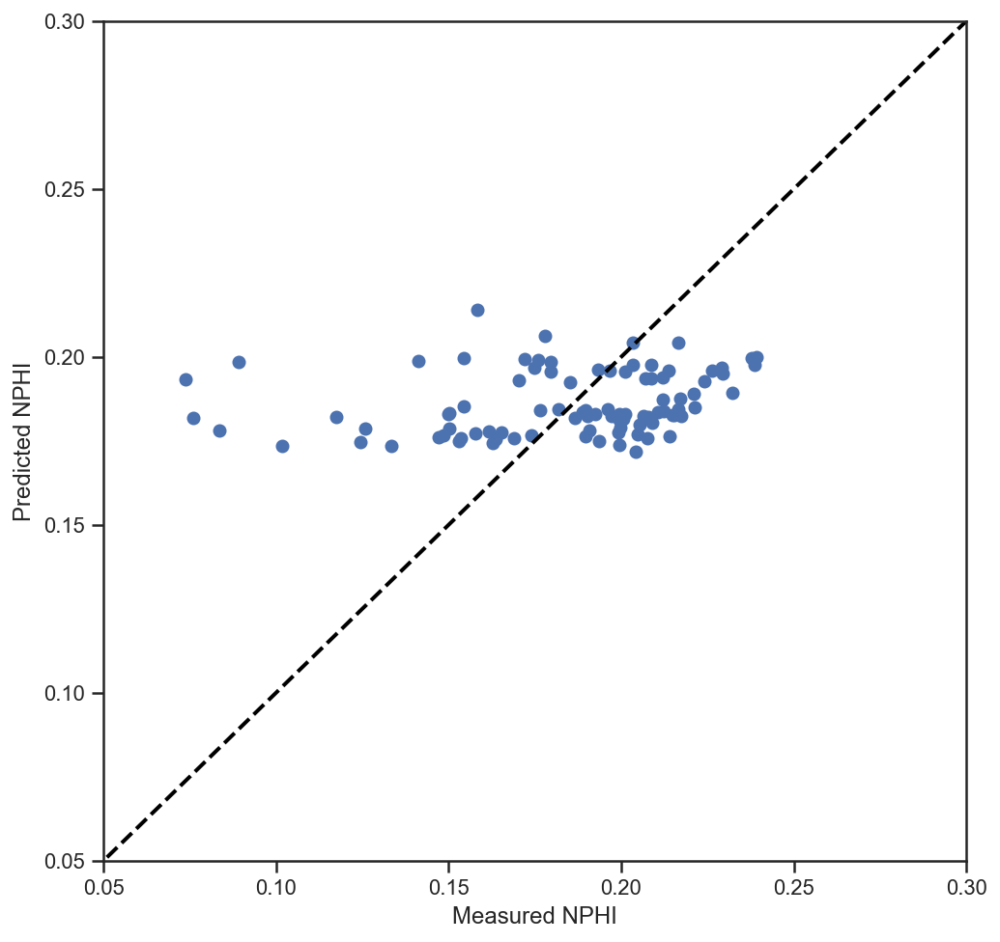

In [174]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_lr, y_pred_lr)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 


In [175]:
NPHI_LinearRegression = pd.DataFrame({'Measured NPHI':y_test_lr, 'Predicted NPHI':y_pred_lr})
NPHI_LinearRegression.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.176840
150,0.1907,0.178148
122,0.2242,0.192610
594,0.1719,0.199210
20,0.2087,0.197585


In [176]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_lr, y_pred_lr))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_lr, y_pred_lr))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_lr, y_pred_lr)))

Mean Absolute Error: 0.030733850789502637
Mean Squared Error: 0.001816295307530849
Root Mean Squared Error: 0.0426180162317634


In [177]:
# Calculate the absolute errors
errors = abs(y_pred_lr - y_test_lr)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_lr)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.03 degrees.
Accuracy: 69.88 %.


### Support Vector Regression

In [118]:
x_train_svm = x_train.copy()
x_test_svm = x_test.copy()
y_train_svm = y_train.copy()
y_test_svm = y_test.copy()

In [119]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
regressor = SVR(kernel = 'rbf')

regressor.fit(x_train_svm, y_train_svm)

SVR()

In [120]:
y_pred_svm = regressor.predict(x_test_svm) 

Text(0.5, 0, 'Measured NPHI')

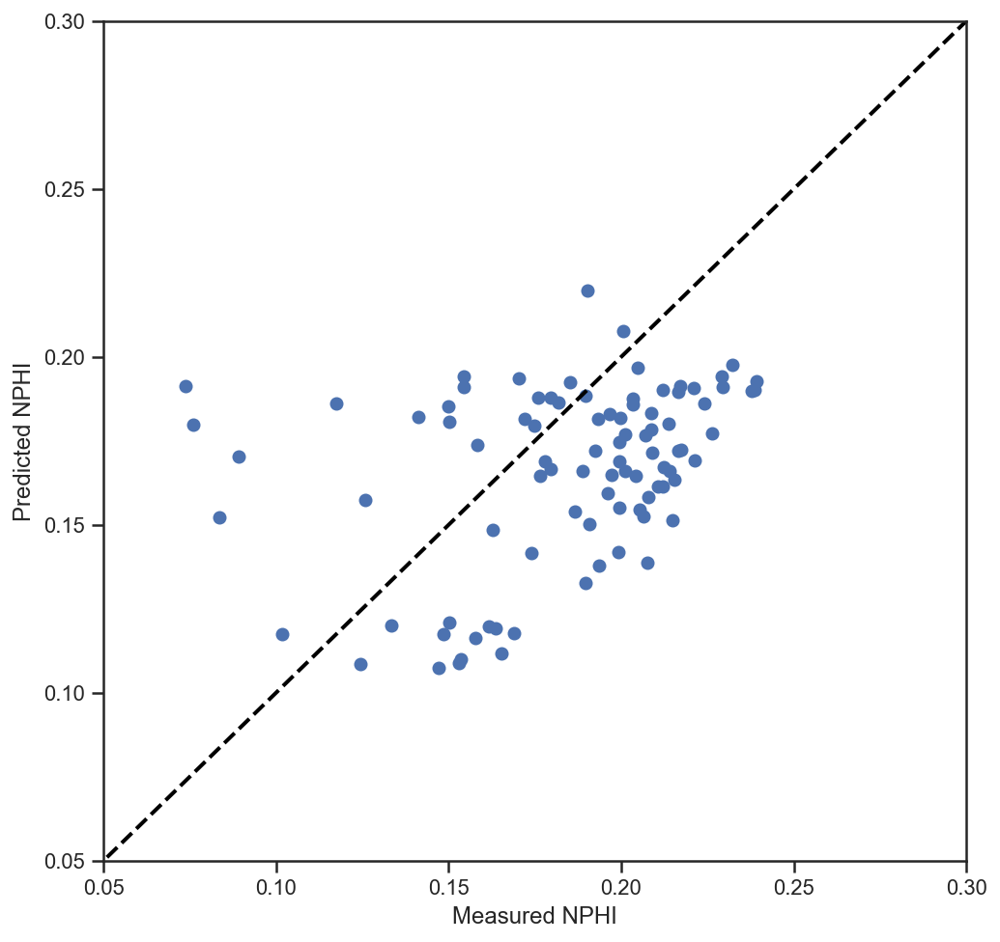

In [121]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_svm, y_pred_svm)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 


In [122]:
NPHI_svm = pd.DataFrame({'Measured NPHI':y_test_svm, 'Predicted NPHI':y_pred_svm})
NPHI_svm.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.196798
150,0.1907,0.150334
122,0.2242,0.186073
594,0.1719,0.181559
20,0.2087,0.183230


In [123]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_svm, y_pred_svm))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_svm, y_pred_svm))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_svm, y_pred_svm)))

Mean Absolute Error: 0.0372821351479476
Mean Squared Error: 0.001939314253197565
Root Mean Squared Error: 0.04403764586348327


In [124]:
# Calculate the absolute errors
errors = abs(y_pred_svm - y_test_svm)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_svm)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.04 degrees.
Accuracy: 70.39 %.


### Hyperparameter Optimization for the SVR

In [125]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
grid_svr = GridSearchCV(
        estimator=SVR(kernel='rbf'),
        param_grid={
            'C': [0.1, 1, 2, 5, 10, 20, 50, 100, 1000],
            'epsilon': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1],
            'gamma': [0.001, 0.01, 0.1, 1, 10],
            'kernel': ['rbf']
        },
        cv=10, verbose=0)

In [126]:
grid_svr.fit(x_train_svm, y_train_svm)

GridSearchCV(cv=10, estimator=SVR(),
             param_grid={'C': [0.1, 1, 2, 5, 10, 20, 50, 100, 1000],
                         'epsilon': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1],
                         'gamma': [0.001, 0.01, 0.1, 1, 10],
                         'kernel': ['rbf']})

In [127]:
print("Score on test set: %f" % grid_svr.score(x_test_svm, y_test_svm))
print("Best parameters: %s" % grid_svr.best_params_)

Score on test set: 0.456057
Best parameters: {'C': 0.1, 'epsilon': 0.001, 'gamma': 10, 'kernel': 'rbf'}


In [128]:
cv_results = pd.DataFrame(grid_svr.cv_results_)
cv_results_tiny = cv_results[['param_C', 'mean_test_score']]
cv_results_tiny.sort_values(by='mean_test_score', ascending=False).head(5)

,param_C,mean_test_score
4,0.1,0.491306
9,0.1,0.484397
14,0.1,0.473019
49,1,0.455990
44,1,0.450001


### Reapply the SVR with Optimal Parameters again 

In [129]:
grid_svr_new=grid_svr.best_estimator_

In [130]:
print('memorization performance: ', grid_svr_new.score(x_train_svm,y_train_svm)) # memorization

print('generalization performance: ', grid_svr_new.score(x_test_svm,y_test_svm))  # generalization

memorization performance:  0.6262538425027211
generalization performance:  0.45605655670598877


In [131]:
y_pred_svmop = grid_svr_new.predict(x_test_svm)

Text(0.5, 0, 'Measured NPHI')

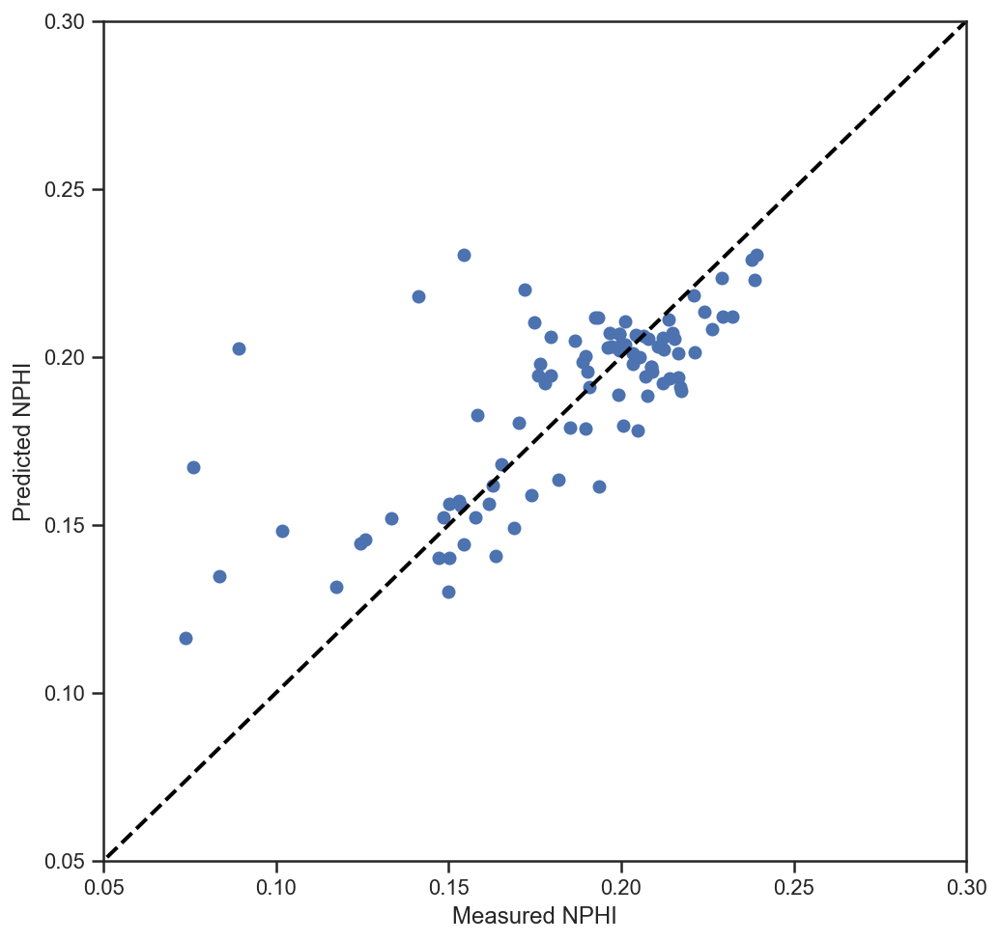

In [132]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_svm, y_pred_svmop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 

In [133]:
NPHI_svm_OP = pd.DataFrame({'Measured NPHI':y_test_svm, 'Predicted NPHI':y_pred_svmop})
NPHI_svm_OP.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.178152
150,0.1907,0.191126
122,0.2242,0.213543
594,0.1719,0.220129
20,0.2087,0.197057


In [134]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_svm, y_pred_svmop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_svm, y_pred_svmop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_svm, y_pred_svmop)))

Mean Absolute Error: 0.019554314880250497
Mean Squared Error: 0.000977789994137463
Root Mean Squared Error: 0.03126963373846044


In [135]:
# Calculate the absolute errors
errors = abs(y_pred_svmop - y_test_svm)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_svm)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 79.64 %.


### MLP Regression

In [136]:
x_train_mlp = x_train.copy()
x_test_mlp = x_test.copy()
y_train_mlp = y_train.copy()
y_test_mlp = y_test.copy()

In [137]:
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor
nn_rgr = rgr = MLPRegressor(hidden_layer_sizes = (15, 45, 25, 100), random_state=1, max_iter=300)

nn_rgr.fit(x_train_mlp,y_train_mlp)

MLPRegressor(hidden_layer_sizes=(15, 45, 25, 100), max_iter=300, random_state=1)

In [138]:
y_pred_mlp = nn_rgr.predict(x_test_mlp)

Text(0.5, 0, 'Measured NPHI')

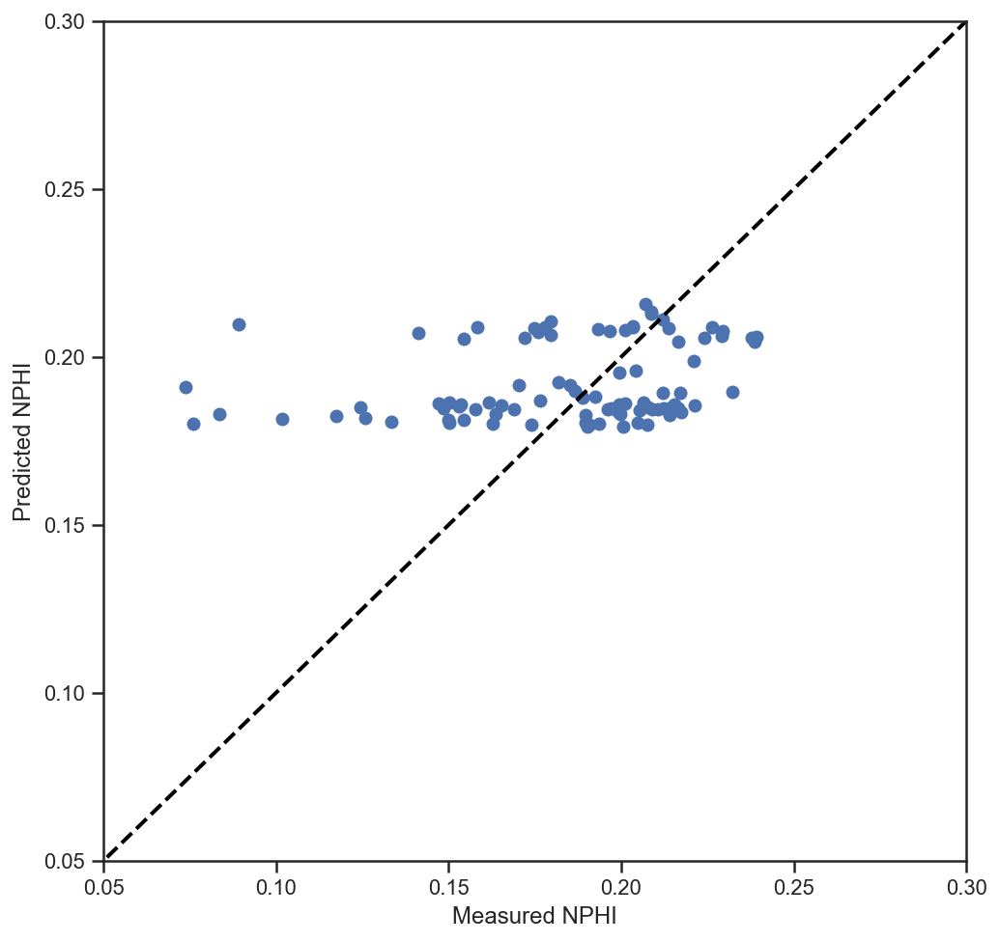

In [139]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_mlp, y_pred_mlp)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 

In [140]:
NPHI_mlp= pd.DataFrame({'Measured NPHI':y_test_mlp, 'Predicted NPHI':y_pred_mlp})
NPHI_mlp.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.180390
150,0.1907,0.179764
122,0.2242,0.205536
594,0.1719,0.205629
20,0.2087,0.213371


In [141]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_mlp, y_pred_mlp))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_mlp, y_pred_mlp))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_mlp, y_pred_mlp)))

Mean Absolute Error: 0.03050270808110434
Mean Squared Error: 0.0018800071067420763
Root Mean Squared Error: 0.04335904872967206


In [142]:
# Calculate the absolute errors
errors = abs(y_pred_mlp - y_test_mlp)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_mlp)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.03 degrees.
Accuracy: 69.29 %.


### Hyperparameter Optimization using MLP 

In [143]:
import itertools 

In [144]:
%%time

params = {'activation': ['relu', 'tanh', 'logistic', 'identity'],
          'hidden_layer_sizes': list(itertools.permutations([50,100,150],2)) + list(itertools.permutations([50,100,150],3)) + [50,100,150],
          'solver': ['adam', 'lbfgs'],
          'learning_rate' : ['constant', 'adaptive', 'invscaling']
         }

mlp_regressor_grid = GridSearchCV(MLPRegressor(random_state=123), param_grid=params, cv=5, verbose=5)

CPU times: user 114 µs, sys: 41 µs, total: 155 µs
Wall time: 62.9 µs


In [145]:
grid_mlp = mlp_regressor_grid.fit(x_train_mlp,y_train_mlp)

Fitting 5 folds for each of 360 candidates, totalling 1800 fits
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.278, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.294, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.161, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.310, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.096, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.5s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.383, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.617, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.160, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.499, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.117, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 100)

[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.425, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.494, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.111, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.391, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.120, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150)

[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.391, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.496, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.120, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.471, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.037, total=   0.7s
[CV] activation=relu, hidden_lay

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.094, total=   1.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.251, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.284, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.184, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.300, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 15

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.094, total=   2.0s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.251, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.284, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.184, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.300, total=   0.2s
[CV] activation=relu, hidden_laye

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.094, total=   1.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.017, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.060, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.072, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.201, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(150, 50), lea

[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.185, total=   1.3s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.294, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.297, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.220, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.266, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=(150, 10

[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.560, total=   1.9s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.177, total=   2.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.158, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.099, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.115, total=   0.2s

[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.488, total=   1.4s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.054, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.402, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.184, total=   2.0s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.152, total= 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.598, total=   2.0s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.158, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.542, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.081, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=0.152, total=   0.2s
[CV] ac

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.598, total=   1.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.158, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.542, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.081, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.152, total=   0.2s
[CV

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.598, total=   2.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.158, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.542, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.081, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=0.173, total= 

[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=0.061, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.414, total=   1.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.603, total=   1.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.316, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.564, total=   1.6s
[CV] a

[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.226, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.398, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.100, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.435, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.621, total=   1.1s
[CV] activ

[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.208, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.320, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.442, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=-0.016, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.424, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  act

[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.068, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.458, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.104, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=0.087, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=0.034, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hi

[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=-0.170, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.047, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.136, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=0.025, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=0.042, total=   0.3s
[CV] activation=tanh, hidden_layer_size

[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.071, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.017, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.026, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.008, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-0.319, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learni

[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.093, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.044, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.080, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.125, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.198, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 

[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=0.065, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.006, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=0.060, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=0.104, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.170, total=   0.2s
[CV] activation=tanh, hidden_layer_size

[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=-0.148, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.038, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.020, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.056, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.135, total=   0.4s
[CV] activatio

[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.074, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.112, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=-0.112, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.065, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.042, total=   0.4s
[CV] act

[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.092, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.059, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.049, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.125, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=-0.148, total=   0.2s
[CV]

[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.056, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-0.090, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.116, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.076, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.017, tot

[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-0.002, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.029, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.065, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-0.560, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.118, total=   0.2s
[CV] activ

[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.205, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.310, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.360, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.168, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.855, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_laye

[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-1.811, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.123, total=   0.0s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.078, total=   0.0s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.058, total=   0.0s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.137, total=   0.0s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.007, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.012, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.010, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.005, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.001, total=   0.2s
[CV] activation=lo

[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.137, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.172, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.051, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=0.012, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.052, total=   0.2s
[

[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.003, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.007, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.001, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.060, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.163, total=   0.2s
[CV] activat

[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.045, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.014, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.050, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=0.009, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.009, total=   0.2s
[CV] activation=log

[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=-0.006, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.004, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.003, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.007, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-0.002, total=   

[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.007, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=0.001, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=0.002, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=

[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=-0.001, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.044, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.009, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.005, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, 

[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=-0.008, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=-0.006, total=   2.8s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=-0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-0.012, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, s

[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-0.080, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.001, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.001, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=-0.007, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=inv

[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-0.055, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-0.078, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.089, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.093, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.017, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solve

[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=-0.013, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.096, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=-0.101, total=   0.0s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-0.146, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-0.238, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=100, learning_r

[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.064, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.034, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.087, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.309, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.106, total=   0.0s
[CV] activation=id

[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=-0.145, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.094, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.041, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.018, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.083, total=   0.1s
[CV] activation=iden

[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.117, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=-0.142, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.073, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-0.030, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.057, total=   0.1s
[CV] a

[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.047, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.120, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.141, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.107, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.059, total=   0.1s
[C

[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.070, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.047, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.121, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=-0.138, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.117, total=   0.2s
[CV] a

[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.285, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.110, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.070, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.037, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbf

[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-0.008, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=0.067, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=0.110, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-0.280, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=invscalin

[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.122, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=-0.132, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-0.103, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-0.241, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver

[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.110, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.072, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.048, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.120, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbf

[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-0.062, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.036, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-0.589, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.111, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs,

[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.303, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.323, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.167, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.943, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.107, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate

[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=0.046, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=0.018, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=0.044, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-0.231, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.108, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, 

[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed:  7.2min finished


In [146]:
print('Train R^2 Score : %.3f'%mlp_regressor_grid.best_estimator_.score(x_train_mlp, y_train_mlp))
print('Test R^2 Score : %.3f'%mlp_regressor_grid.best_estimator_.score(x_test_mlp, y_test_mlp))
print('Best R^2 Score Through Grid Search : %.3f'%mlp_regressor_grid.best_score_)
print('Best Parameters : ',mlp_regressor_grid.best_params_)

Train R^2 Score : 0.657
Test R^2 Score : 0.464
Best R^2 Score Through Grid Search : 0.415
Best Parameters :  {'activation': 'relu', 'hidden_layer_sizes': (150, 50, 100), 'learning_rate': 'constant', 'solver': 'lbfgs'}


### Reapply the MLP with Optimal Parameters again

In [147]:
grid_mlp_new=grid_mlp.best_estimator_

In [148]:
print('memorization performance: ', grid_mlp_new.score(x_train_mlp,y_train_mlp)) # memorization

print('generalization performance: ', grid_mlp_new.score(x_test_mlp,y_test_mlp))  # generalization

memorization performance:  0.6568077415472584
generalization performance:  0.46399736206265796


In [149]:
y_pred_mlpop = grid_mlp_new.predict(x_test_mlp)

Text(0.5, 0, 'Measured NPHI')

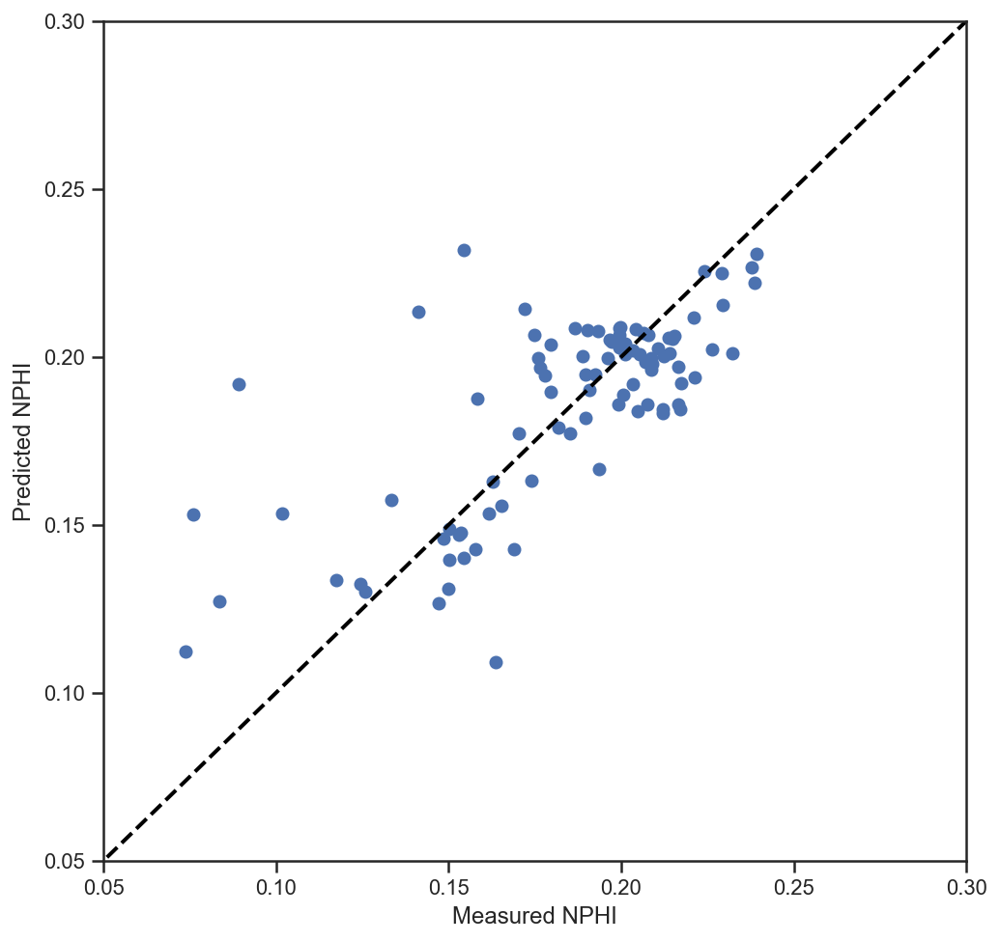

In [150]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([0.05, 0.3, 0.05, 0.3])
plt.scatter(y_test_mlp, y_pred_mlpop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 

In [151]:
NPHI_mlp_OP = pd.DataFrame({'Measured NPHI':y_test_mlp, 'Predicted NPHI':y_pred_mlpop})
NPHI_mlp_OP.head()

,Measured NPHI,Predicted NPHI
285,0.2047,0.183699
150,0.1907,0.190078
122,0.2242,0.225489
594,0.1719,0.214382
20,0.2087,0.196240


In [152]:
# Calculate the absolute errors
errors = abs(y_pred_mlpop - y_test_mlp)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_mlp)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 80.09 %.


In [178]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_mlp, y_pred_mlpop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_mlp, y_pred_mlpop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_mlp, y_pred_mlpop)))

Mean Absolute Error: 0.019754135287157214
Mean Squared Error: 0.0009635156424215486
Root Mean Squared Error: 0.031040548358905462
